# Project 10: Chapter 8 - Advanced Data Analysis

## Using a Double Index to work with Panel Data

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

data = pd.read_csv("fraserDataWithRGDPPC.csv", index_col = ["ISO_Code_3","Year"], parse_dates = True).rename(columns = {"Summary":"EFW"})

In [2]:
data

ISO_Code_2   World Bank Region  \
ISO_Code_3 Year                                        
AGO        1970-01-01         AO  Sub-Saharan Africa   
           1975-01-01         AO  Sub-Saharan Africa   
           1980-01-01         AO  Sub-Saharan Africa   
           1985-01-01         AO  Sub-Saharan Africa   
           1990-01-01         AO  Sub-Saharan Africa   
...                          ...                 ...   
ZWE        2016-01-01         ZW  Sub-Saharan Africa   
           2017-01-01         ZW  Sub-Saharan Africa   
           2018-01-01         ZW  Sub-Saharan Africa   
           2019-01-01         ZW  Sub-Saharan Africa   
           2020-01-01         ZW  Sub-Saharan Africa   

                      World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)  \
ISO_Code_3 Year                                                                                                                                              
AGO        1970-01-01                                                NaN                                                                                     
           1975-01-01                                                NaN                                                                                     
           1980-01-01                                                NaN                                                                                     
           1985-01-01                                                NaN                                                                                     
           1990-01-01                                                 LM                                                                                     
...                                                                  ...                                                                                     
ZWE        2016-01-01                                                  L                                                                                     
           2017-01-01                                                  L                                                                                     
           2018-01-01                                                 LM                                                                                     
           2019-01-01                                                 LM                                                                                     
           2020-01-01                                                 LM                                                                                     

                      Countries       EFW  Size of Government  \
ISO_Code_3 Year                                                 
AGO        1970-01-01    Angola       NaN                 NaN   
           1975-01-01    Angola       NaN                 NaN   
           1980-01-01    Angola       NaN                 NaN   
           1985-01-01    Angola       NaN                 NaN   
           1990-01-01    Angola       NaN                 NaN   
...                         ...       ...                 ...   
ZWE        2016-01-01  Zimbabwe  6.121996            5.332597   
           2017-01-01  Zimbabwe  5.599886            4.699843   
           2018-01-01  Zimbabwe  5.876298            5.170946   
           2019-01-01  Zimbabwe  4.719465            5.628359   
           2020-01-01  Zimbabwe  4.480000            5.562008   

                       Legal System and Property Rights  Sound Money  \
ISO_Code_3 Year                                                        
AGO        1970-01-01                               NaN          NaN   
           1975-01-01                               NaN          NaN   
           1980-01-01                               NaN          NaN   
           1985-01-01           

In [3]:
data.index[0]

('AGO', Timestamp('1970-01-01 00:00:00'))

# Isolate each individual that comprises the multiindex

In [4]:
countries = data.index.get_level_values("ISO_Code_3").unique()
countries

Index(['AGO', 'ALB', 'ARE', 'ARG', 'ARM', 'AUS', 'AUT', 'AZE', 'BDI', 'BEL',
       ...
       'UGA', 'UKR', 'URY', 'USA', 'VEN', 'VNM', 'YEM', 'ZAF', 'ZMB', 'ZWE'],
      dtype='object', name='ISO_Code_3', length=165)

In [5]:
years = data.index.get_level_values("Year").unique()
years

DatetimeIndex(['1970-01-01', '1975-01-01', '1980-01-01', '1985-01-01',
               '1990-01-01', '1995-01-01', '2000-01-01', '2001-01-01',
               '2002-01-01', '2003-01-01', '2004-01-01', '2005-01-01',
               '2006-01-01', '2007-01-01', '2008-01-01', '2009-01-01',
               '2010-01-01', '2011-01-01', '2012-01-01', '2013-01-01',
               '2014-01-01', '2015-01-01', '2016-01-01', '2017-01-01',
               '2018-01-01', '2019-01-01', '2020-01-01'],
              dtype='datetime64[ns]', name='Year', freq=None)

In [6]:
def create_indicator_variable(data, indicator_name, index_name, target_index_list):
    data[indicator_name] = 0
    data[indicator_name][data.index.get_level_values(index_name).isin(target_index_list)]=1
    #for index in target_index_list:  
        #data.loc[data.index.get_level_values(\
            #index_name) == index, [indicator_name]] = 1 
    
index_name = data.index.names[0]
indicator_name = "North America"
countries_in_north_america = [
    "BHS", "BRB", "BLZ", "CAN", "CRI", "DOM", "SLV",
    "GTM", "HTI", "HND", "JAM", "MEX", "NIC", "PAN",
    "TTO", "USA"] 
create_indicator_variable(data = data, 
    indicator_name = indicator_name,  
    index_name = index_name, 
    target_index_list = countries_in_north_america)
data.loc["USA"]

/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/432100108.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[indicator_name][data.index.get_level_values(index_name).isin(target_index_list)]=1


,ISO_Code_2,World Bank Region,"World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)",Countries,EFW,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation,Standard Deviation of the 5 EFW Areas,RGDP Per Capita,North America
Year,,,,,,,,,,,,,
1970-01-01,US,North America,NaN,United States,7.615181,5.341231,8.286741,9.588817,8.232334,6.631262,1.648185,23958.0000,1
1975-01-01,US,North America,NaN,United States,7.907324,5.336851,8.670280,9.067438,8.412407,8.042706,1.483975,25956.0000,1
1980-01-01,US,North America,NaN,United States,8.101368,5.788734,8.684269,9.122306,8.544966,8.359863,1.322304,29611.0000,1
1985-01-01,US,North America,NaN,United States,8.295413,6.582616,8.726823,9.339660,8.505198,8.335644,1.031484,33023.0000,1
1990-01-01,US,North America,H,United States,8.461126,7.262163,8.350956,9.669842,8.537828,8.477998,0.853932,36982.0000,1
1995-01-01,US,North America,H,United States,8.588435,7.446569,8.587870,9.787931,8.594211,8.538840,0.828418,39390.6254,1
2000-01-01,US,North America,H,United States,8.648077,7.704726,8.773170,9.607665,8.466601,8.739485,0.683215,45886.4705,1
2001-01-01,US,North America,H,United States,8.509072,7.521319,8.615158,9.612028,8.397002,8.464019,0.744511,45878.0092,1
2002-01-01,US,North America,H,United States,8.568646,7.673536,8.370127,9.724310,8.298912,8.819880,0.760212,46266.2959,1


# Plotting Indicator Variables in Scatter

/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/2516626359.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (20,12))


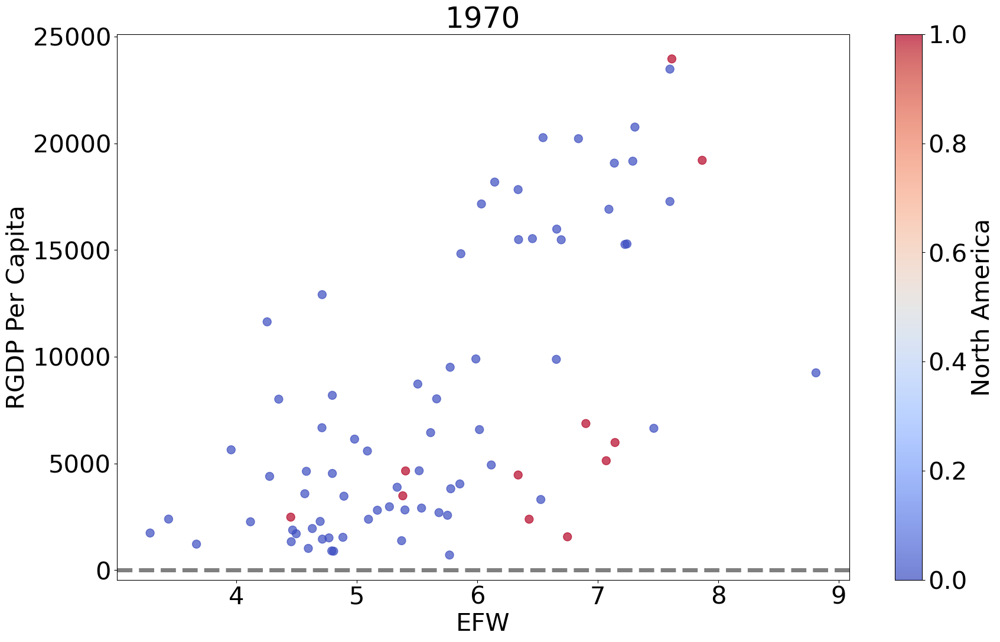

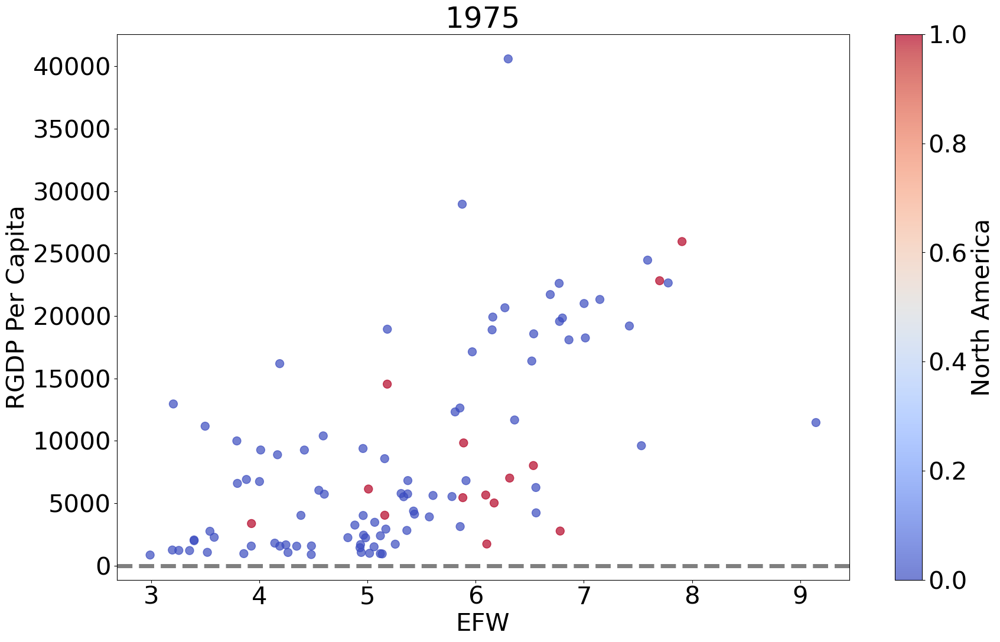

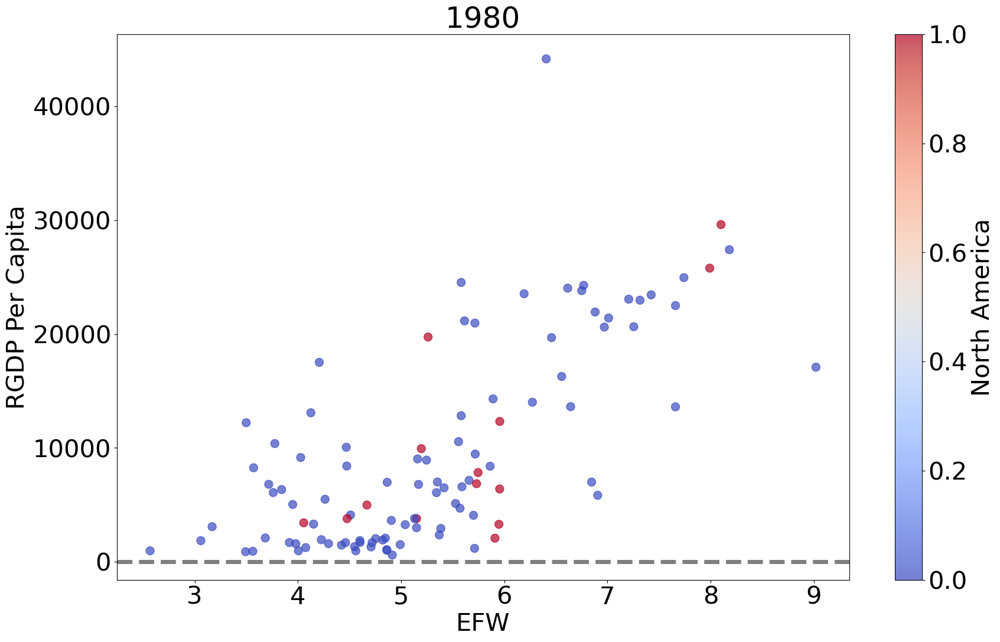

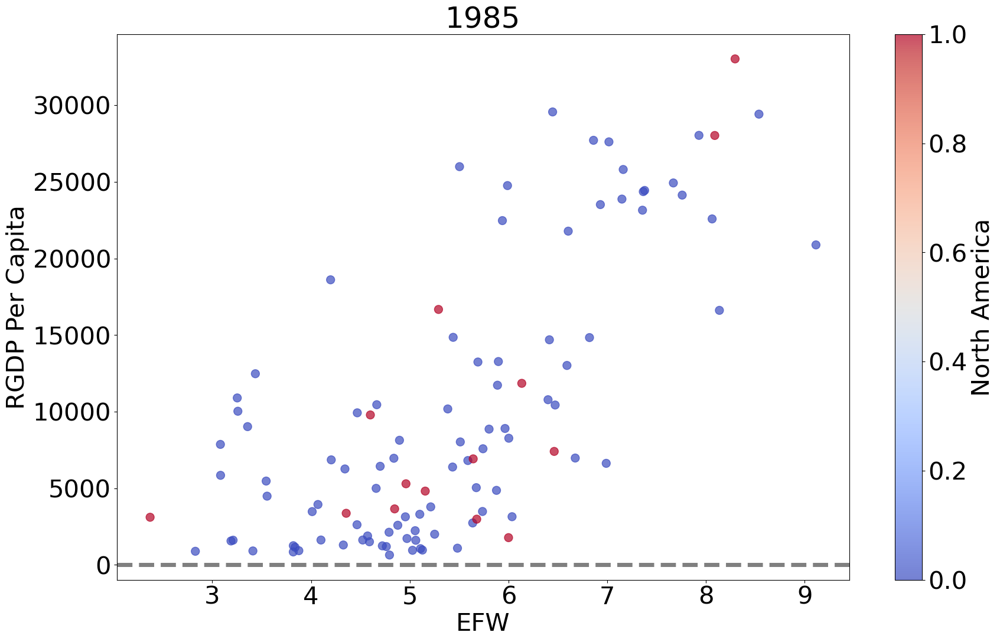

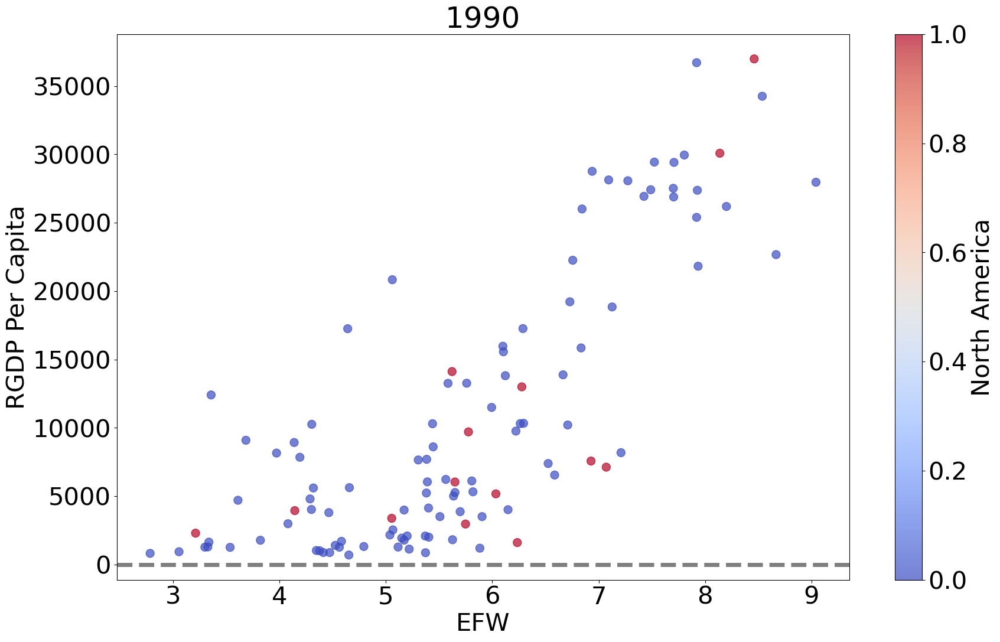

...

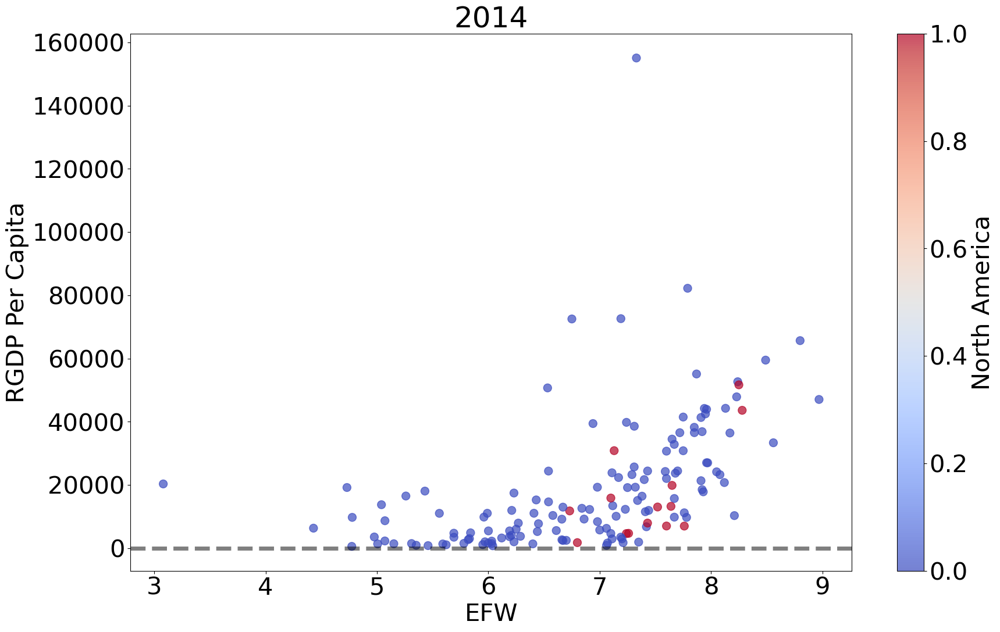

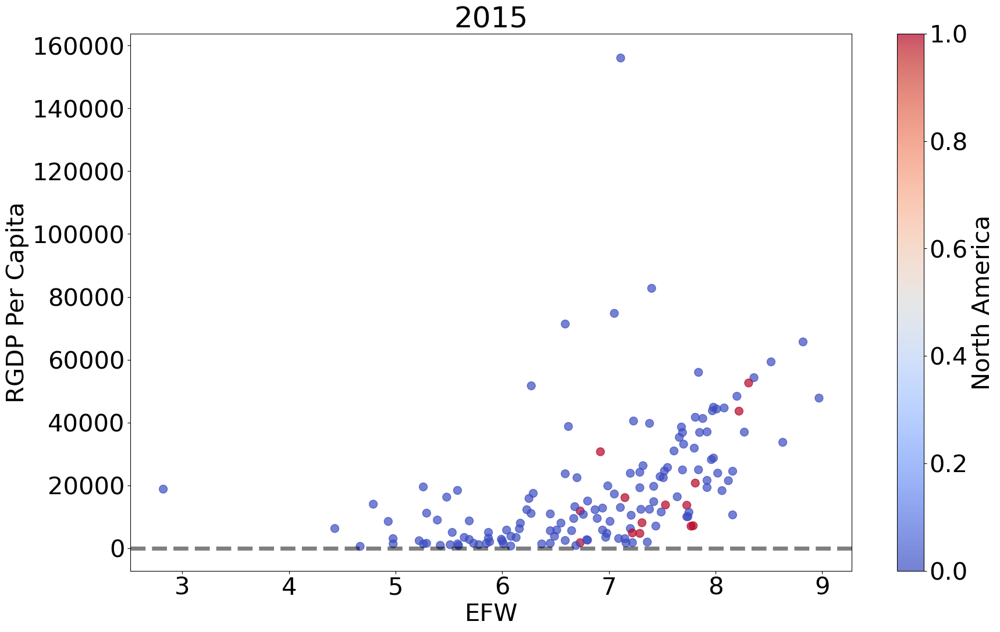

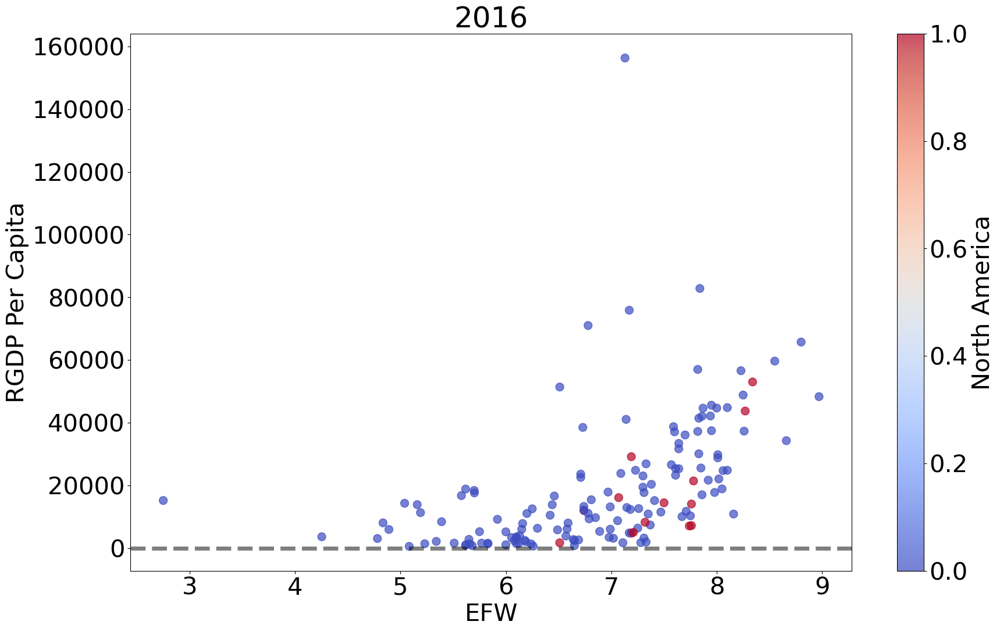

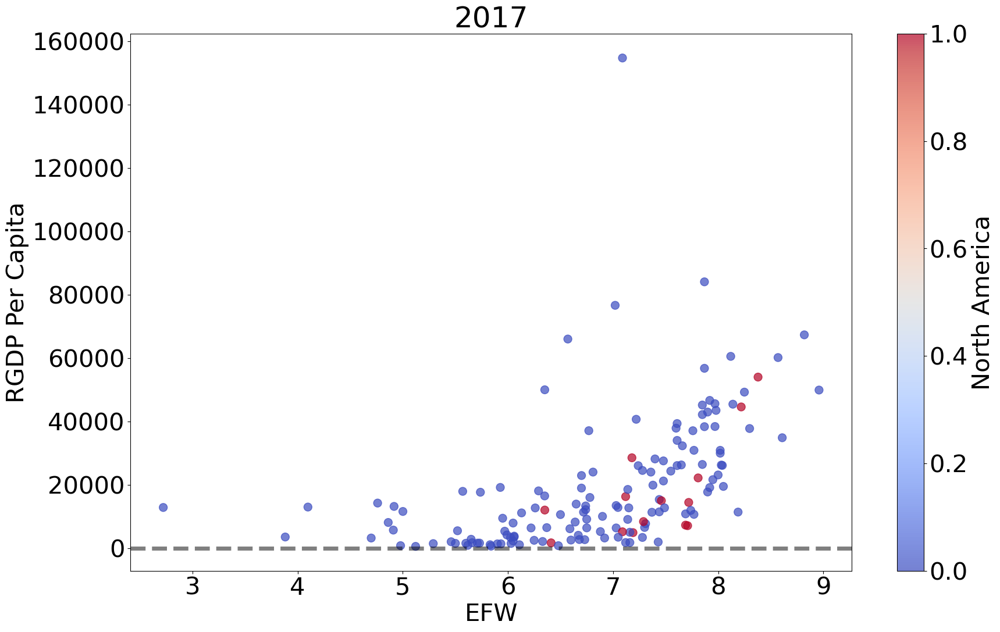

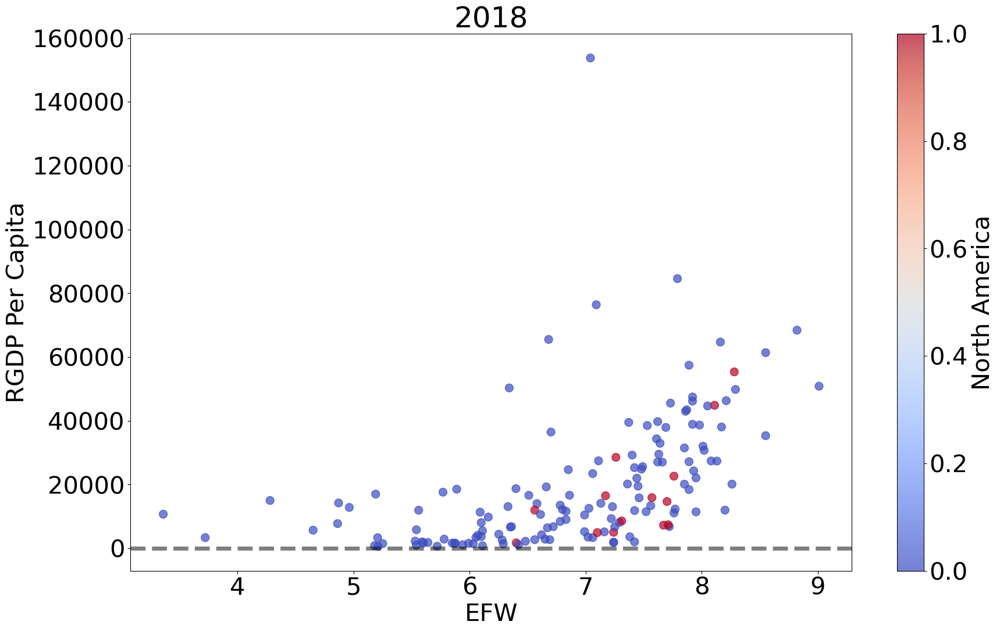

In [7]:
plt.rcParams.update({"font.size":30})
years = data.dropna(subset = ["RGDP Per Capita"]).index.get_level_values("Year").unique()
# year = "2000"
for year in years:
    plot_data = data[data.index.get_level_values("Year") == year]
    fig, ax = plt.subplots(figsize = (20,12))
    plot_data.plot.scatter(x = "EFW", y = "RGDP Per Capita", c = "North America", cmap = "coolwarm", s = 100, alpha = .7, ax = ax)
    ax.set_title(str(year)[:4])
    ax.axhline(0, ls = "--", color = "k", alpha =.5, linewidth = 5)

/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/367169369.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (20,12))


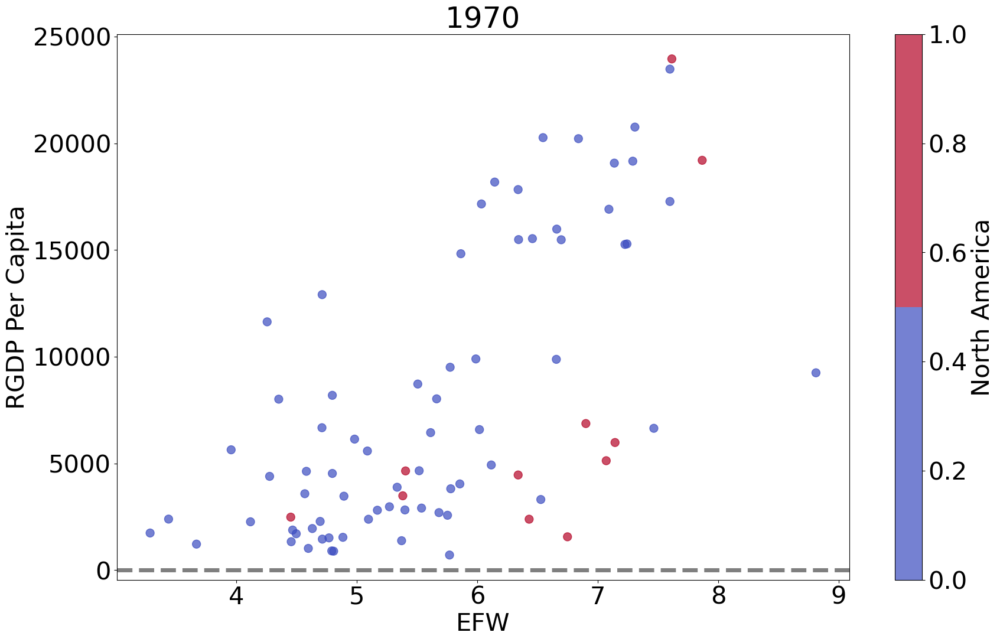

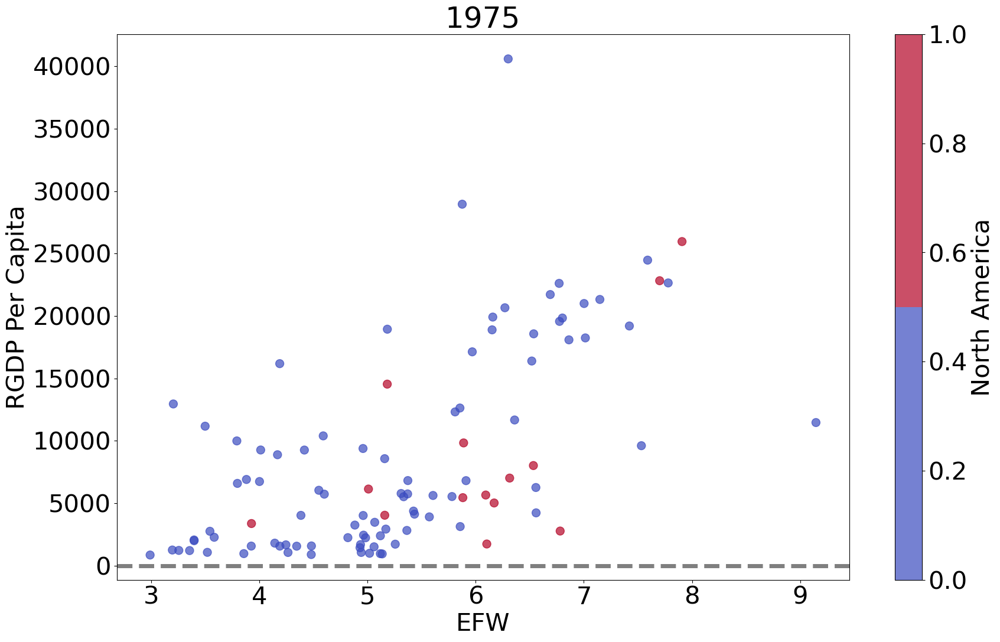

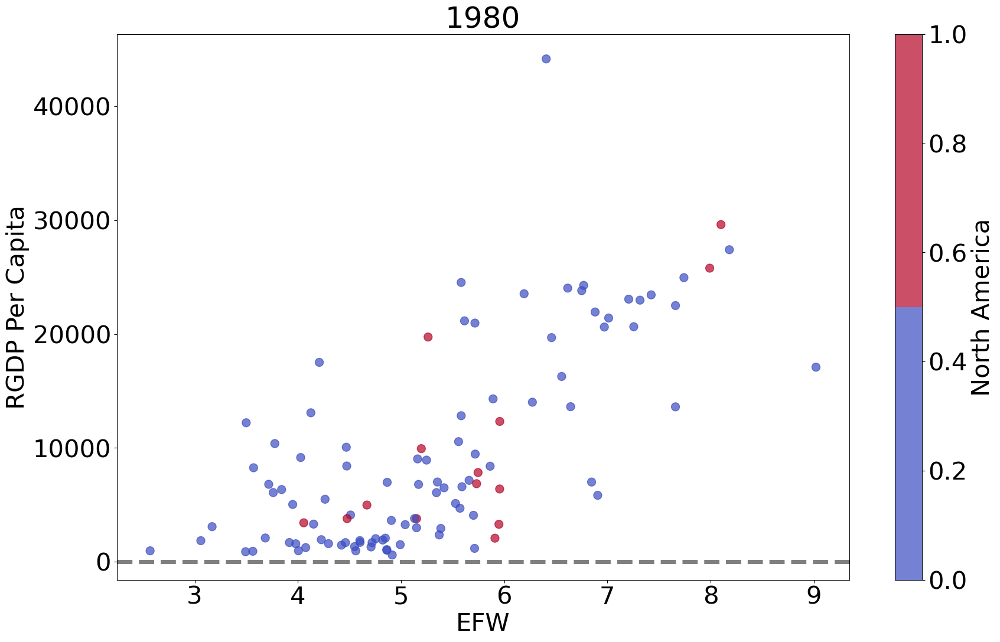

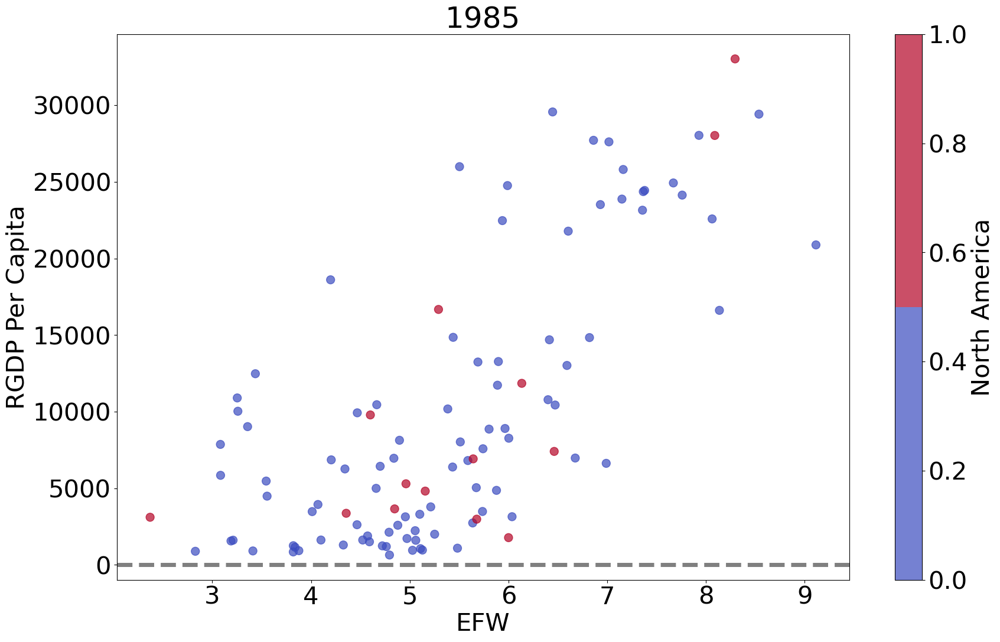

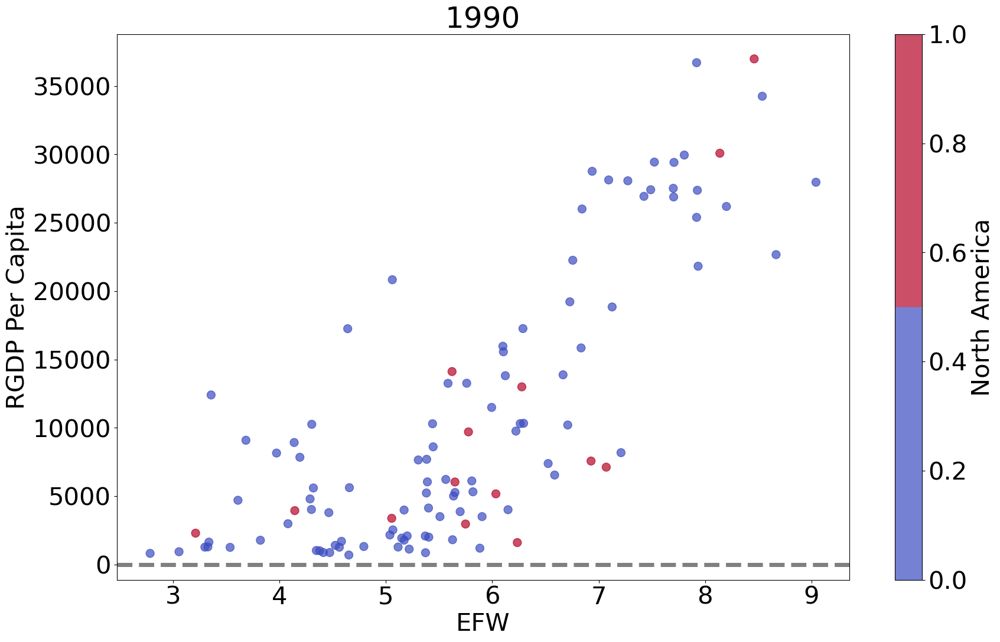

...

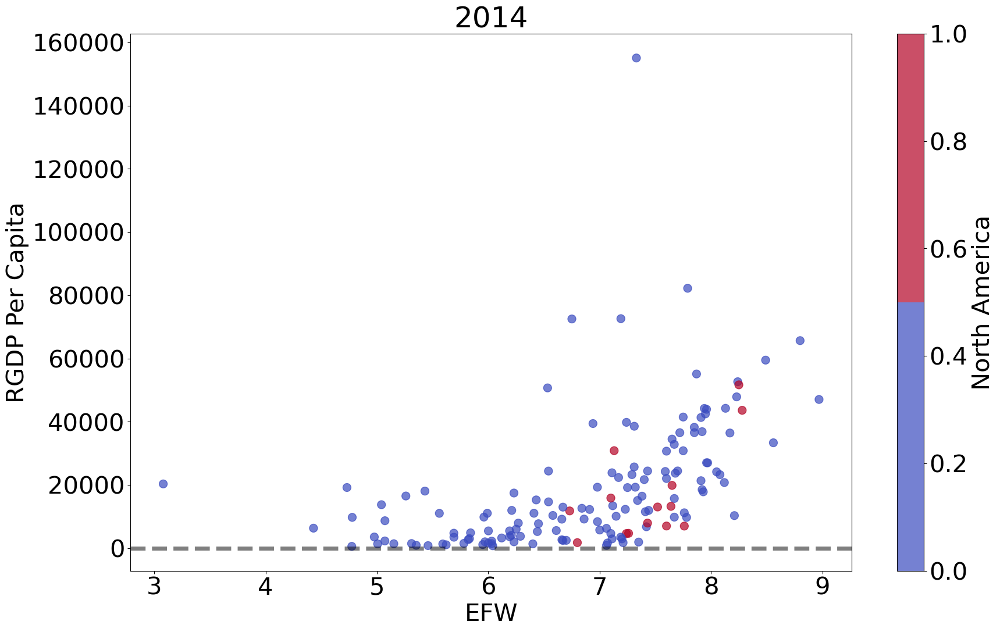

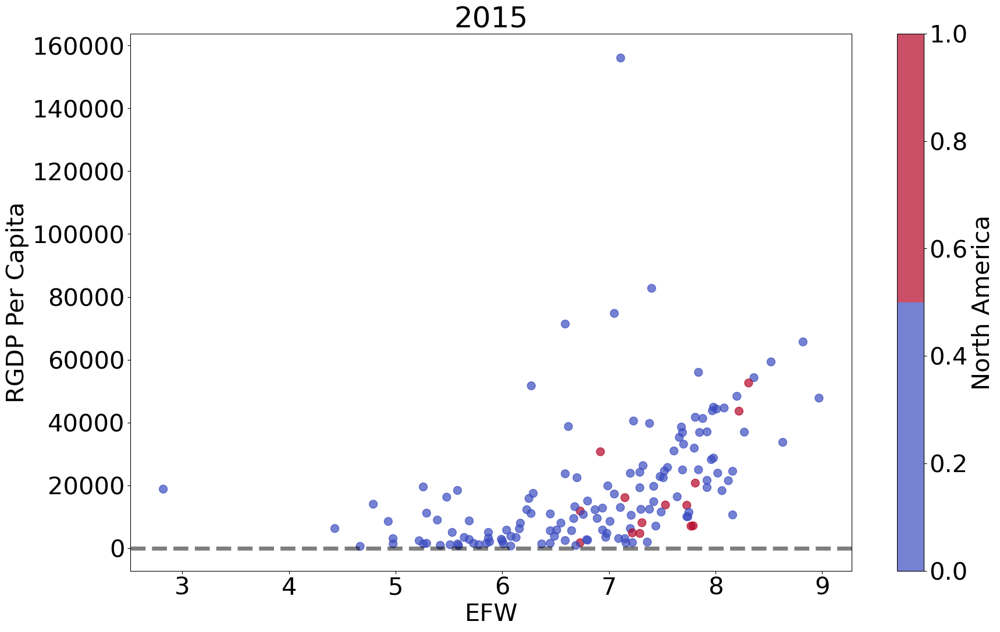

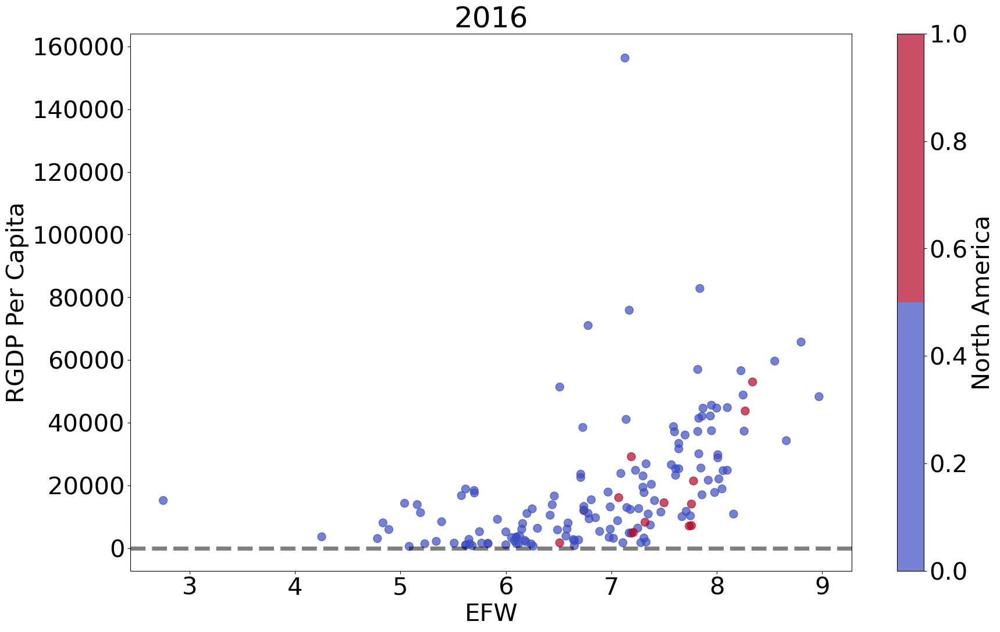

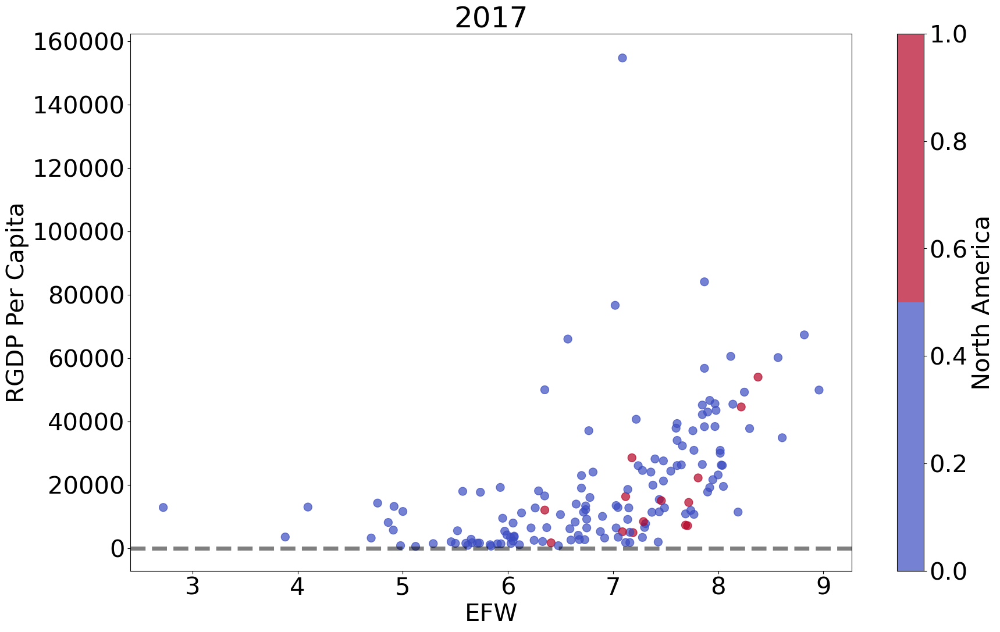

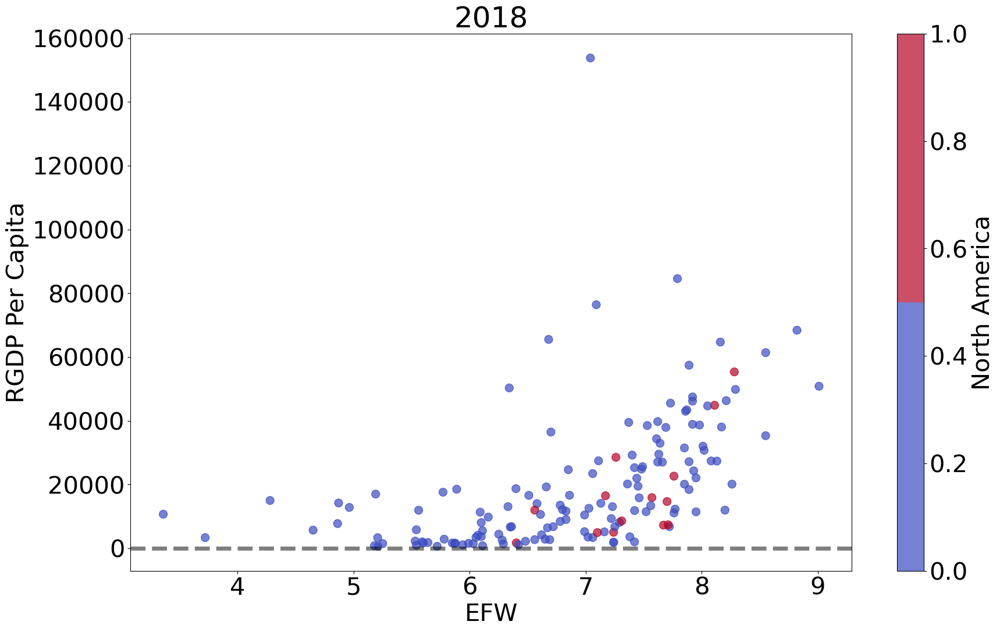

In [8]:
from matplotlib import cm
plt.rcParams.update({"font.size":30})
years = data.dropna(subset = ["RGDP Per Capita"]).index.get_level_values("Year").unique()
# year = "2000"
norm = cm.colors.Normalize()
cmap = cm.get_cmap('coolwarm', 2)
for year in years:
    plot_data = data[data.index.get_level_values("Year") == year]
    fig, ax = plt.subplots(figsize = (20,12))
    plot_data.plot.scatter(x = "EFW", y = "RGDP Per Capita", c = "North America", cmap = cmap, s = 100, alpha = .7, ax = ax)
    ax.set_title(str(year)[:4])
    ax.axhline(0, ls = "--", color = "k", alpha =.5, linewidth = 5)

In [9]:
n = 5
quantile_var = "RGDP Per Capita"
quantile_name = quantile_var + " " + str(n) + "-tile"
data[quantile_name] = np.nan

In [10]:
def create_quantile(n,
                    data,
                    year,
                    quantile_var,
                    quantile_name):
    # index that identifies countries for a given year
    year_index = data.index.get_level_values("Year") == year
    quantile_values_dict = {i:data[year_index][quantile_var].quantile(i/n) for i in range (1, n+1)}
    for index in data[year_index].index:
        # indentify value of the variable of interest
        val = data.loc[index][quantile_var]
        for i in range(1, n+1):
            if val <= quantile_values_dict[i]:
                data.loc[index, [quantile_name]] = int((n + 1) - i)
                break
            else:
                continue
    
for year in years:
    create_quantile(n, data, year, quantile_var, quantile_name)
    
data.loc["USA"].dropna()

,ISO_Code_2,World Bank Region,"World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)",Countries,EFW,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation,Standard Deviation of the 5 EFW Areas,RGDP Per Capita,North America,RGDP Per Capita 5-tile
Year,,,,,,,,,,,,,,
1990-01-01,US,North America,H,United States,8.461126,7.262163,8.350956,9.669842,8.537828,8.477998,0.853932,36982.0000,1,1.0
1995-01-01,US,North America,H,United States,8.588435,7.446569,8.587870,9.787931,8.594211,8.538840,0.828418,39390.6254,1,1.0
2000-01-01,US,North America,H,United States,8.648077,7.704726,8.773170,9.607665,8.466601,8.739485,0.683215,45886.4705,1,1.0
2001-01-01,US,North America,H,United States,8.509072,7.521319,8.615158,9.612028,8.397002,8.464019,0.744511,45878.0092,1,1.0
2002-01-01,US,North America,H,United States,8.568646,7.673536,8.370127,9.724310,8.298912,8.819880,0.760212,46266.2959,1,1.0
2003-01-01,US,North America,H,United States,8.558717,7.866283,8.257379,9.743489,8.338465,8.662287,0.712756,47157.9953,1,1.0
2004-01-01,US,North America,H,United States,8.618290,8.071277,8.139297,9.753433,8.378804,8.786829,0.689687,48492.7171,1,1.0
2005-01-01,US,North America,H,United States,8.509323,7.892833,7.937832,9.704102,8.289870,8.736210,0.747288,49654.7614,1,1.0
2006-01-01,US,North America,H,United States,8.509323,7.871725,7.874278,9.650034,8.305433,8.861652,0.754435,50489.8600,1,1.0


/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/2690977733.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (24,16))


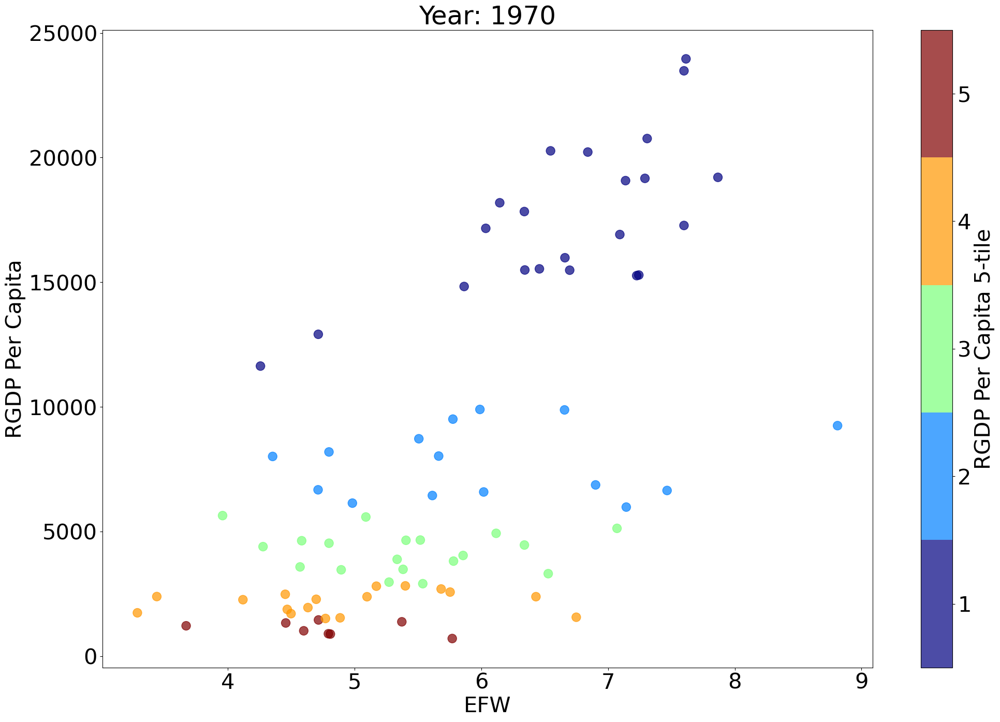

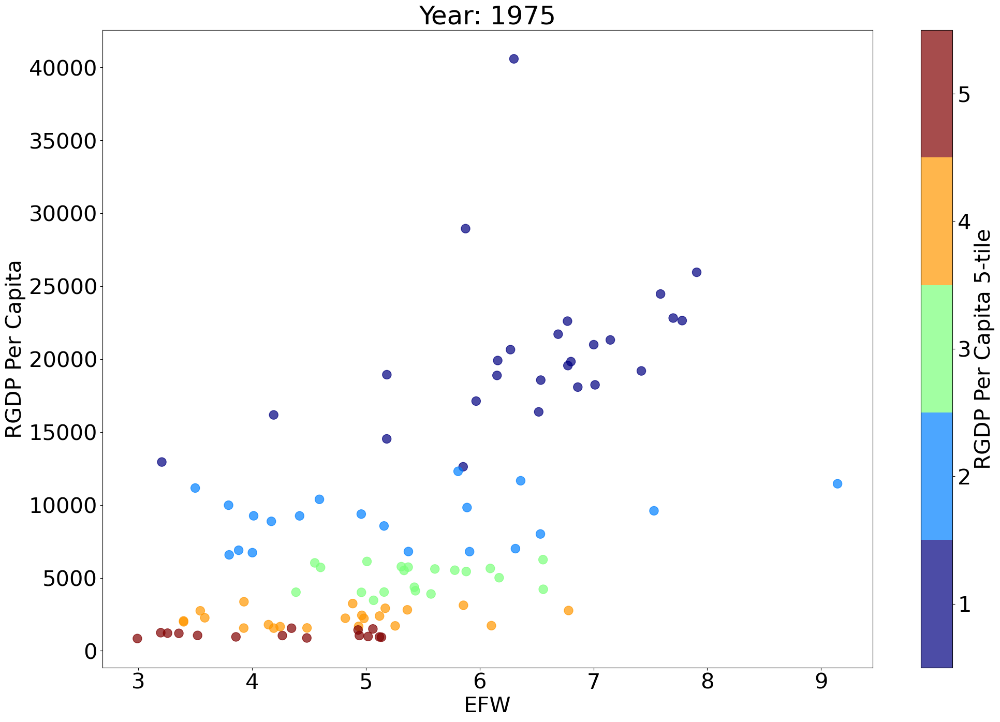

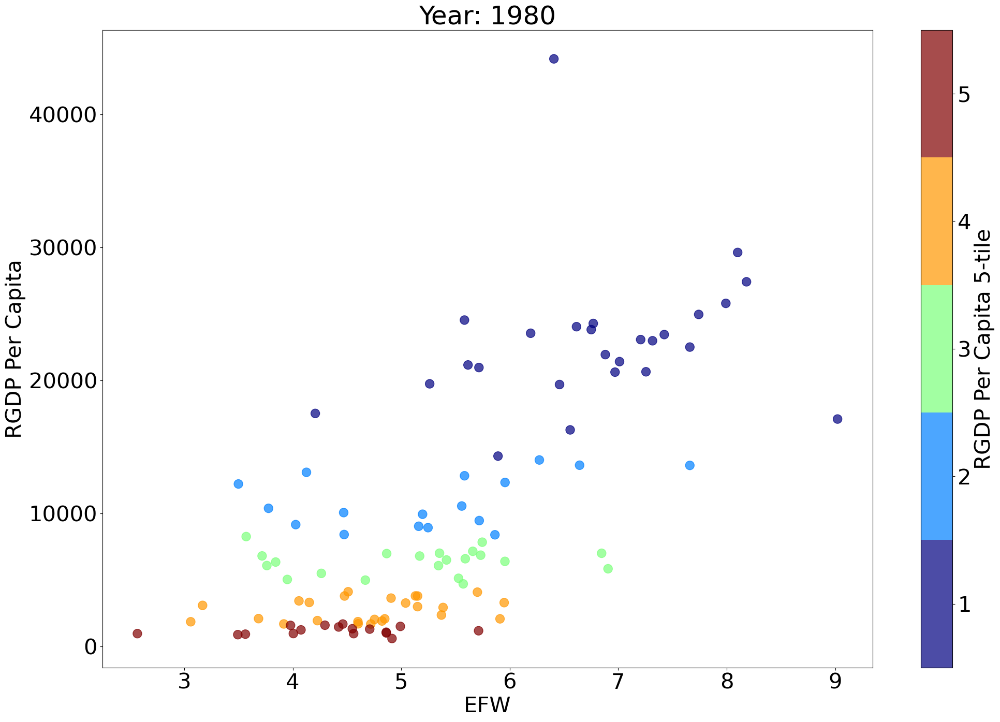

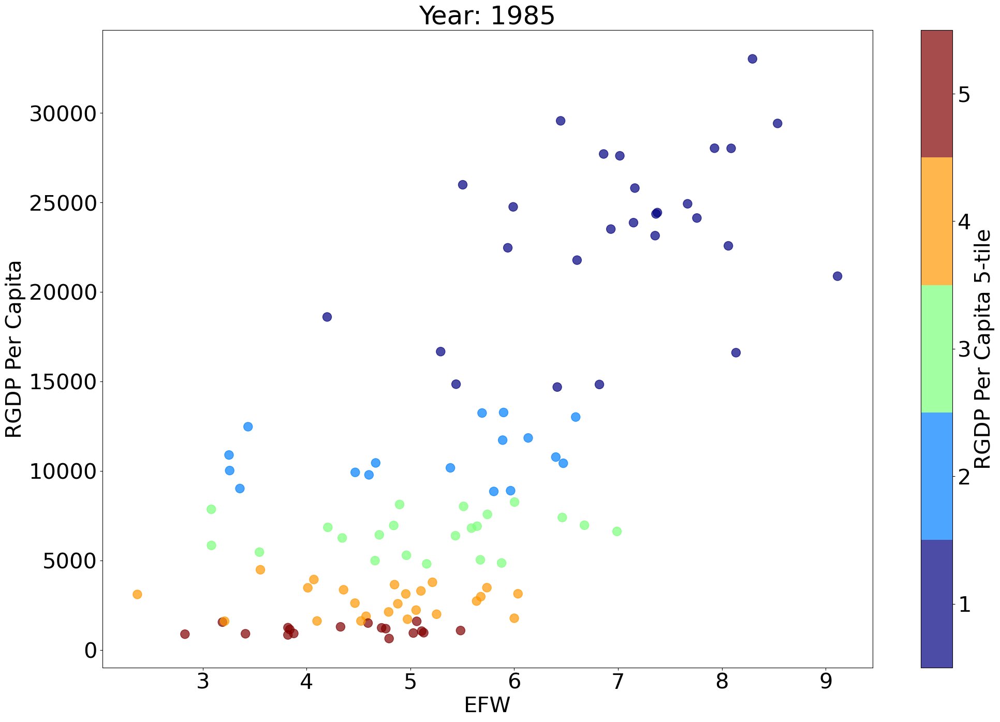

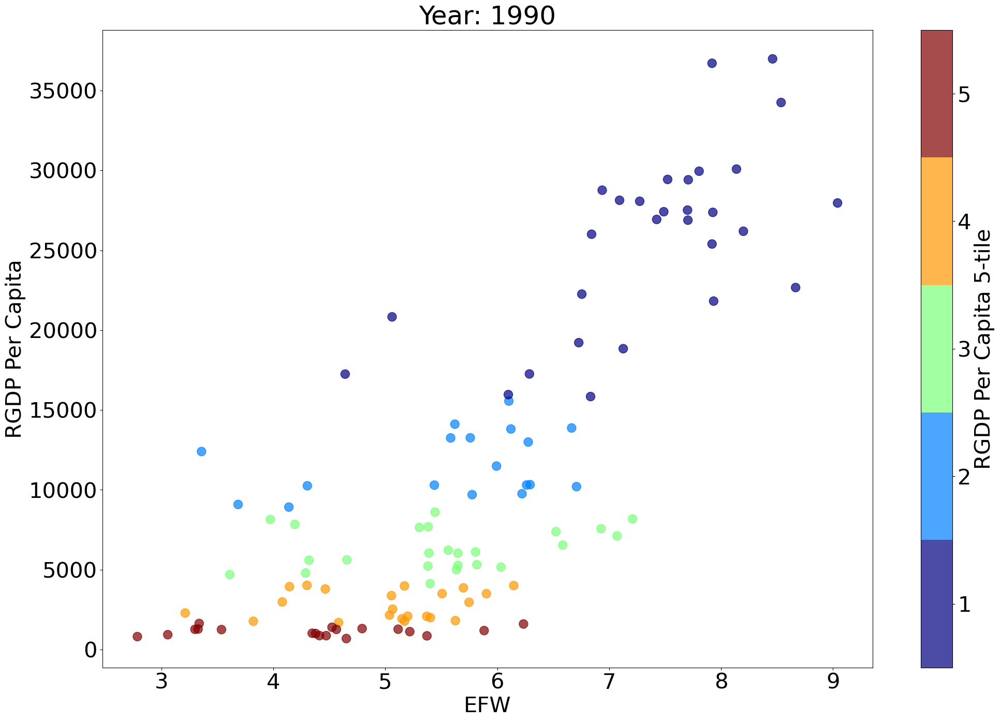

...

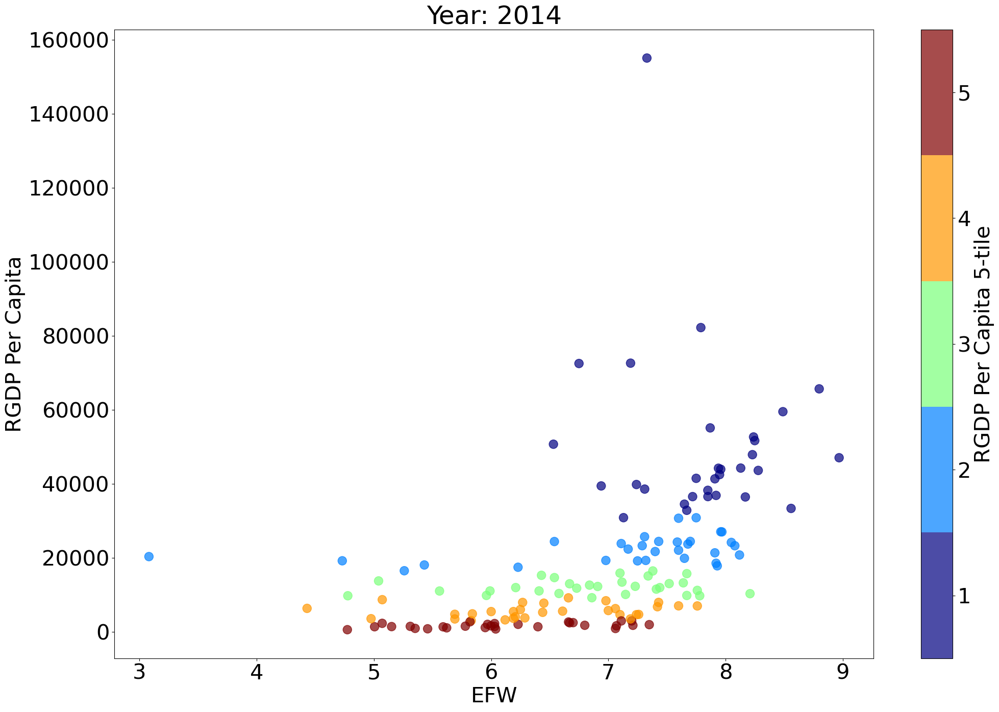

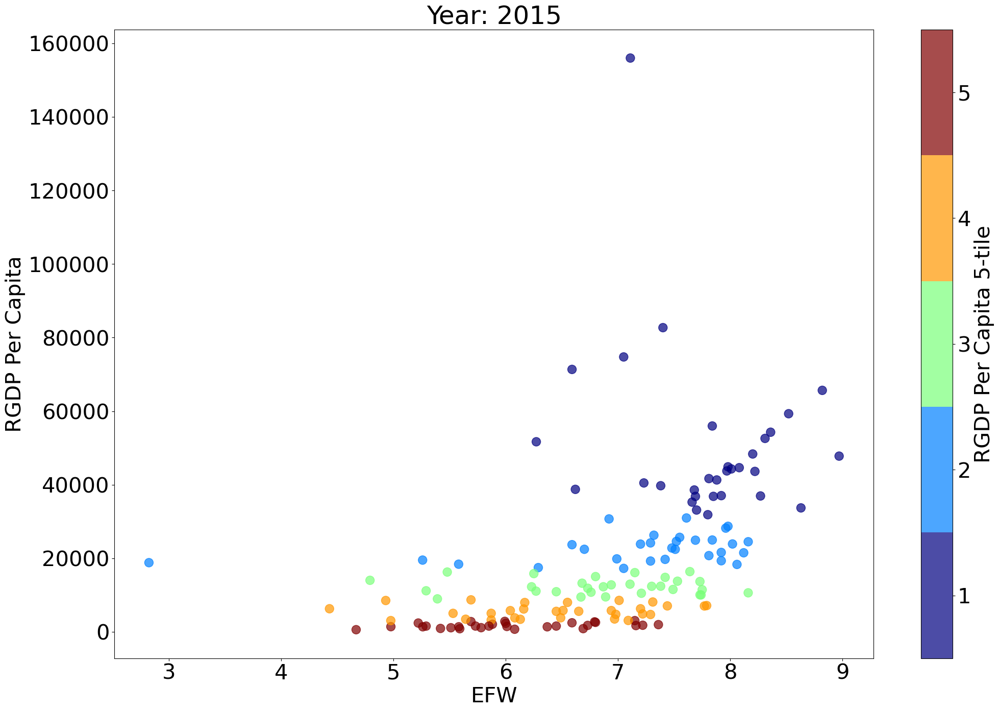

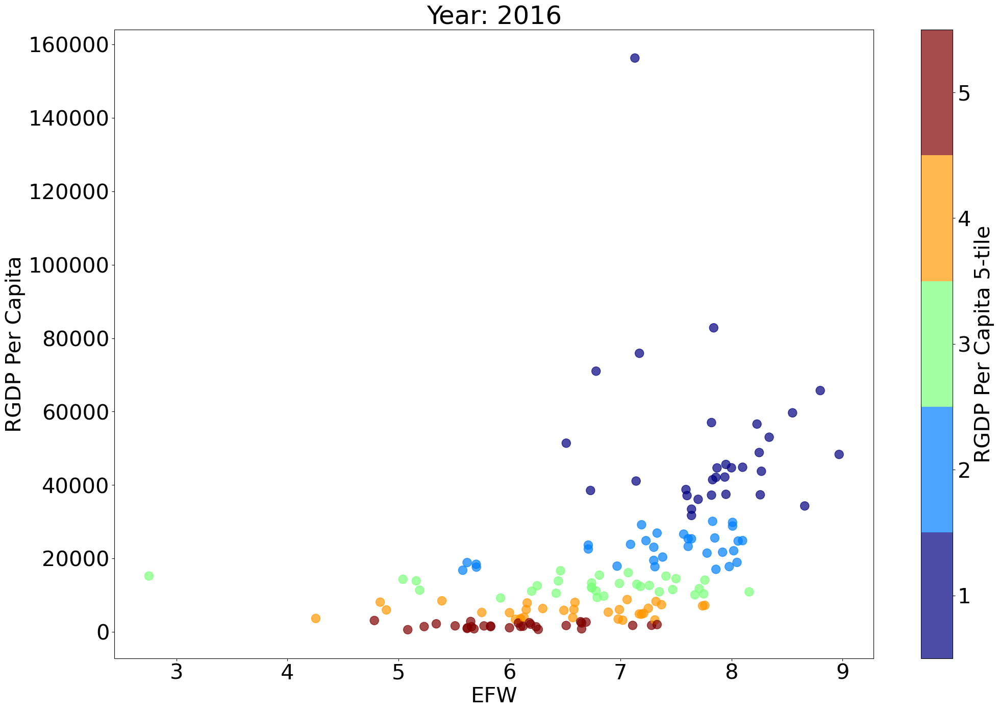

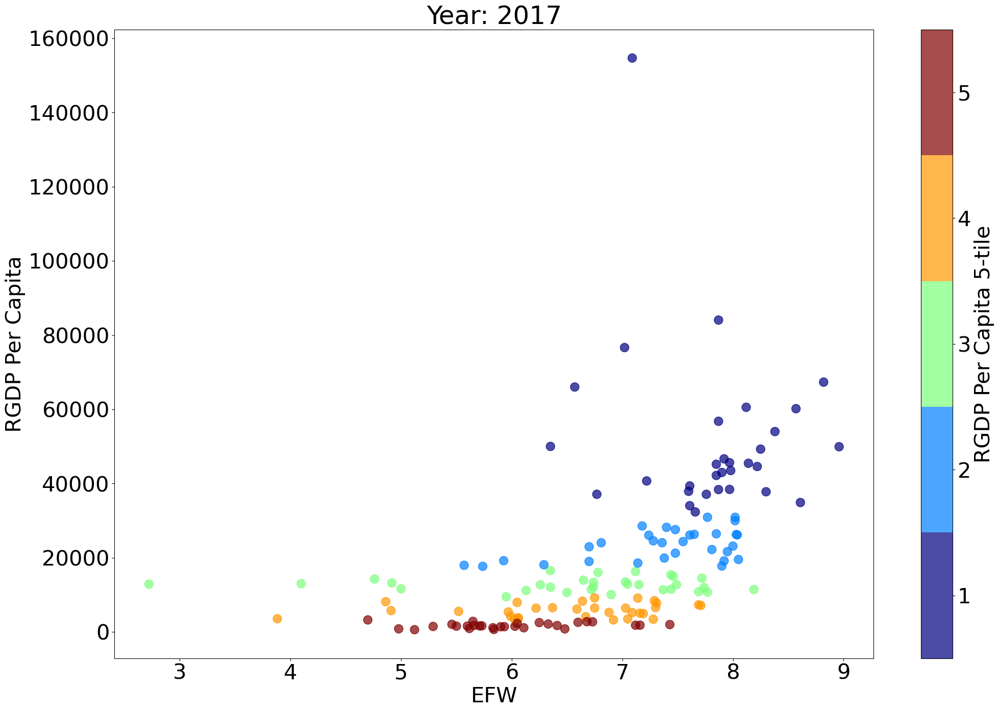

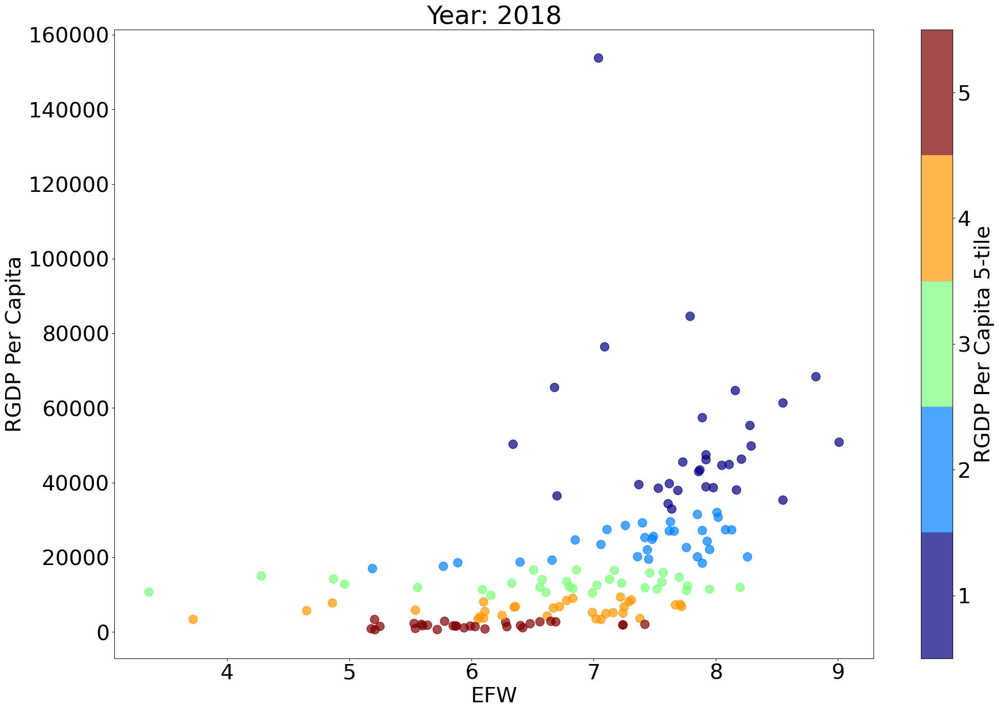

In [11]:
year = "2000"
for year in years:
    # select the data for specific years
    plot_data = data[data.index.get_level_values("Year") == year]
    fig, ax = plt.subplots(figsize = (24,16))
    norm = cm.colors.Normalize()
    cmap = cm.get_cmap("jet", n)
    plot_data.plot.scatter(x = "EFW",
                          y = "RGDP Per Capita",
                          c = "RGDP Per Capita " + str(n) + "-tile",
                          ax = ax,
                          s = 150,
                          alpha = .7,
                          cmap = cmap,
                          vmin = .5,
                           vmax = 5.5)
    ax.set_title("Year: " + str(year)[:4])

In [12]:
data[data["North America"] == 1].index.get_level_values("ISO_Code_3").unique

<bound method Index.unique of Index(['BHS', 'BHS', 'BHS', 'BHS', 'BHS', 'BHS', 'BHS', 'BHS', 'BHS', 'BHS',
       ...
       'USA', 'USA', 'USA', 'USA', 'USA', 'USA', 'USA', 'USA', 'USA', 'USA'],
      dtype='object', name='ISO_Code_3', length=432)>

In [13]:
import statsmodels.api as sm
def regress(data, x_names, y_name, constant = False):
    x = data[x_names]
    if constant:
        X["constant"] = 1
    y = data[y_name]
    results = sm.OLS(x,y).fit()
    return results

y_name = ["EFW"]
X_names = ["RGDP Per Capita"]
reg_data = data.dropna()
results = regress(reg_data, X_names, y_name, constant = False)
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:        RGDP Per Capita   R-squared (uncentered):                   0.558
Model:                            OLS   Adj. R-squared (uncentered):              0.557
Method:                 Least Squares   F-statistic:                              3537.
Date:                Tue, 02 May 2023   Prob (F-statistic):                        0.00
Time:                        06:32:51   Log-Likelihood:                         -31229.
No. Observations:                2808   AIC:                                  6.246e+04
Df Residuals:                    2807   BIC:                                  6.247e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
EFW         2688.6007     45.206     59.474      0.000    2599.960    2777.241
==============================================================================
Omnibus:                     1814.539   Durbin-Watson:                   0.126
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            31007.890
Skew:                           2.800   Prob(JB):                         0.00
Kurtosis:                      18.286   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/3260160126.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Predictor"] = results.predict()
/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/3260160126.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Residuals"] = results.resid


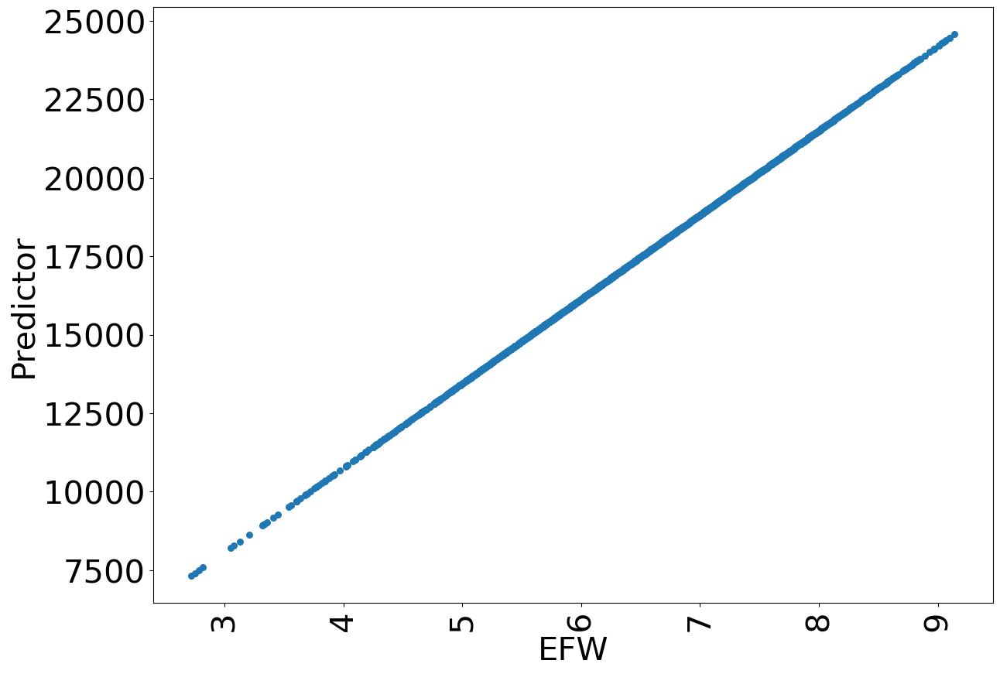

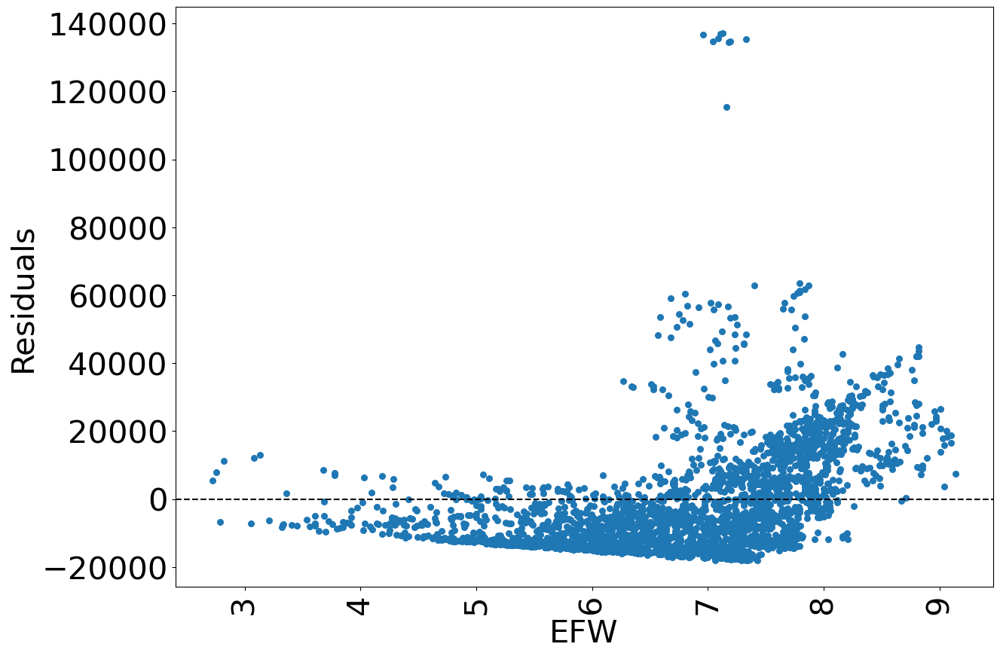

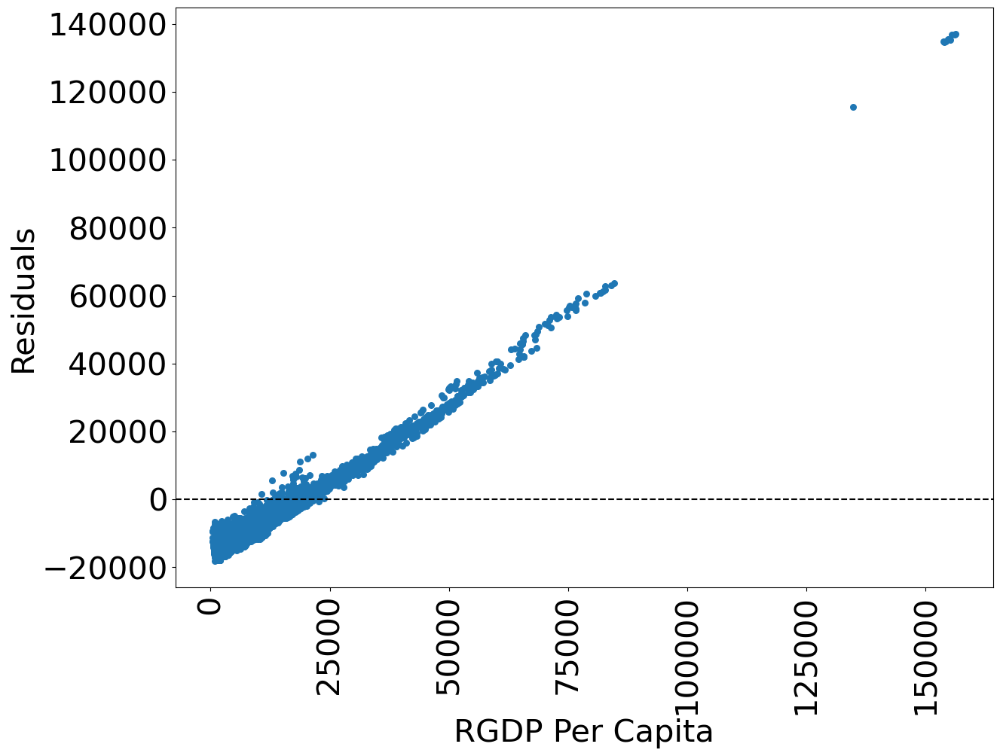

In [14]:
def plot_residuals(df, y_var, x_vars):
    fig, ax = plt.subplots(figsize = (14, 10))
    df.plot.scatter(x = y_var[0],
                     y = "Predictor", 
                      s = 30, ax = ax)
    plt.xticks(rotation=90)
    plt.show()
    plt.close()

    # cycle through all variables included in regression
    # concatenate y_var and x_vars to form a single list
    for var in y_var + x_vars:
        fig, ax = plt.subplots(figsize = (14,10))
        df.plot.scatter(x = var,
                         y = "Residuals", 
                          s = 30, ax = ax)
        ax.axhline(0, ls = "--", color = "k")
        plt.xticks(rotation=90)
        plt.show()
        plt.close()
        
reg_data["Predictor"] = results.predict()
reg_data["Residuals"] = results.resid
plot_residuals(reg_data, y_name, X_names)

In [15]:
X_names = ["RGDP Per Capita 5-tile"]
results = regress(reg_data, X_names, y_name, constant = False)
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                   OLS Regression Results                                  
===========================================================================================
Dep. Variable:     RGDP Per Capita 5-tile   R-squared (uncentered):                   0.711
Model:                                OLS   Adj. R-squared (uncentered):              0.710
Method:                     Least Squares   F-statistic:                              6891.
Date:                    Tue, 02 May 2023   Prob (F-statistic):                        0.00
Time:                            06:32:52   Log-Likelihood:                         -5525.9
No. Observations:                    2808   AIC:                                  1.105e+04
Df Residuals:                        2807   BIC:                                  1.106e+04
Df Model:                               1                                                  
Covariance Type:                nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
EFW            0.3972      0.005     83.014      0.000       0.388       0.407
==============================================================================
Omnibus:                     2381.277   Durbin-Watson:                   0.117
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              172.017
Skew:                           0.076   Prob(JB):                     4.44e-38
Kurtosis:                       1.797   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [16]:
X_names = ["RGDP Per Capita"]
reg_data = reg_data[y_name + X_names].groupby("ISO_Code_3").diff().dropna()
results = regress(reg_data, X_names, y_name, constant = False)
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:        RGDP Per Capita   R-squared (uncentered):                   0.033
Model:                            OLS   Adj. R-squared (uncentered):              0.033
Method:                 Least Squares   F-statistic:                              91.24
Date:                Tue, 02 May 2023   Prob (F-statistic):                    2.78e-21
Time:                        06:32:52   Log-Likelihood:                         -22903.
No. Observations:                2656   AIC:                                  4.581e+04
Df Residuals:                    2655   BIC:                                  4.581e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
EFW          925.3358     96.874      9.552      0.000     735.380    1115.291
==============================================================================
Omnibus:                     2818.142   Durbin-Watson:                   1.134
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           359306.736
Skew:                           5.018   Prob(JB):                         0.00
Kurtosis:                      59.090   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

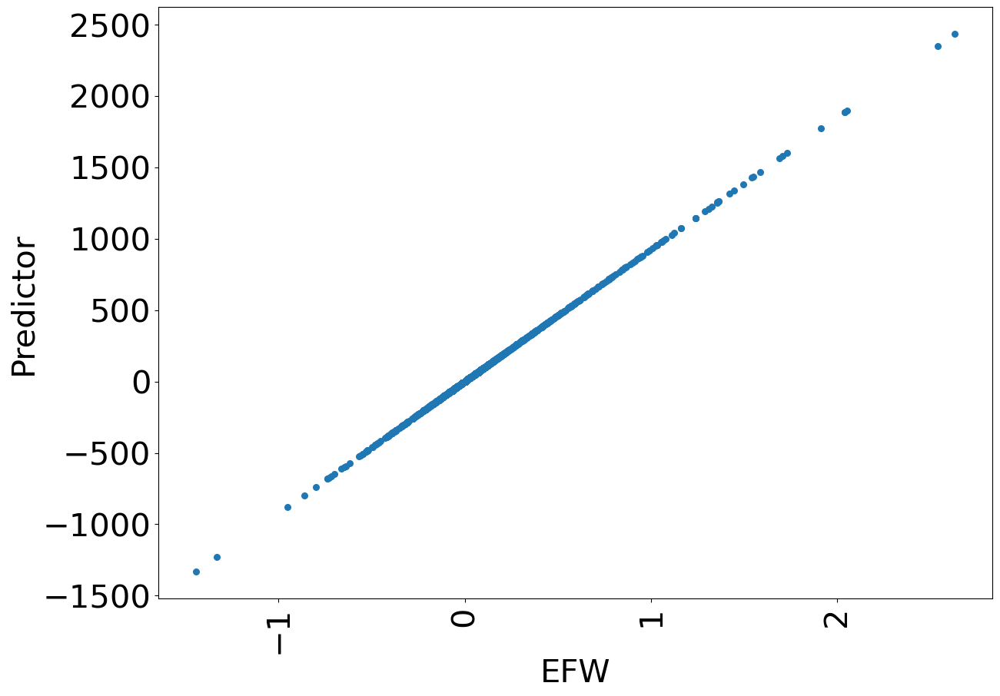

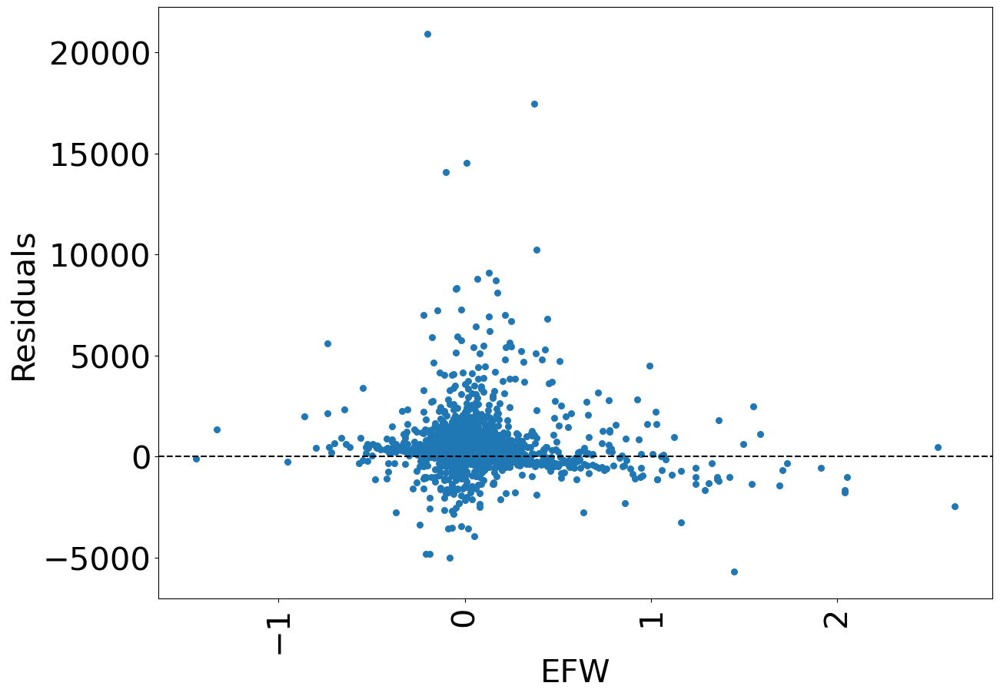

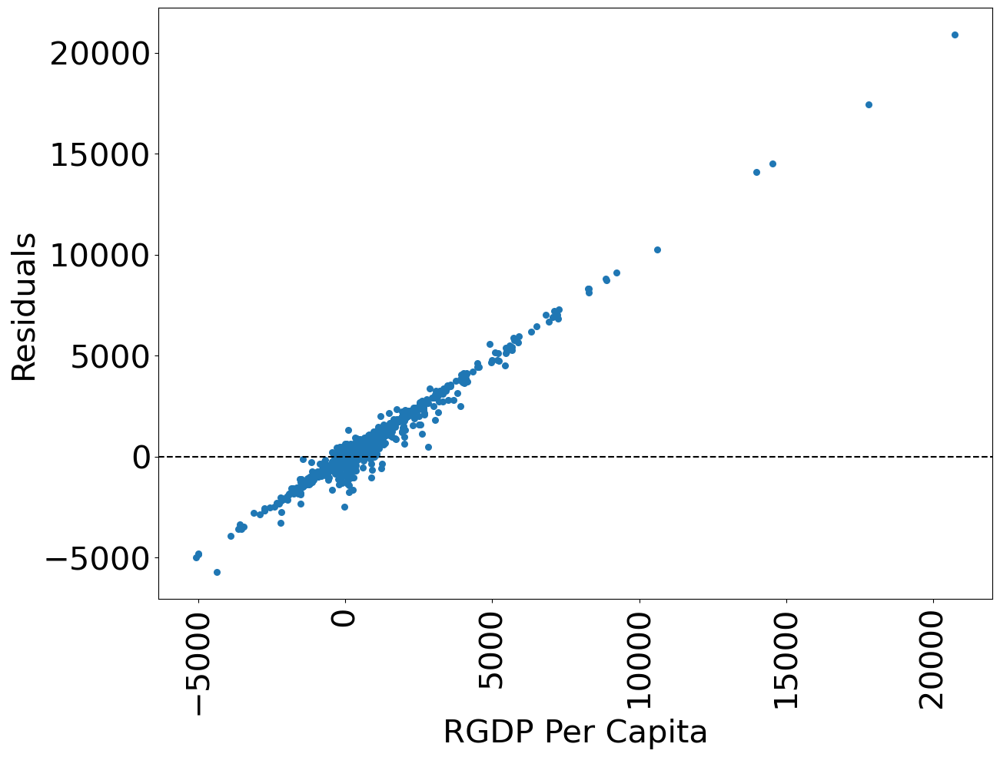

In [17]:
reg_data["Predictor"] = results.predict()
reg_data["Residuals"] = results.resid
plot_residuals(reg_data, y_name, X_names)

## Panel Regressions

In [18]:
!pip install linearmodels

In [19]:
from linearmodels import PanelOLS
def panel_regress(data, X_names, y_name, constant = False, entity = False, time = False):
    X = data[X_names]
    if constant:
        X["constant"] = 1
    y = data[y_name]
    results = PanelOLS(y, X, entity_effects = entity, time_effects = time).fit(cov_type='clustered', cluster_entity = True)
    return results

reg_data = data.dropna()
results = panel_regress(reg_data, X_names, y_name, constant = True, entity = True, time = True)
results
    

/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/1817762948.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["constant"] = 1


Dep. Variable:,EFW,R-squared:,0.0121
Estimator:,PanelOLS,R-squared (Between):,-0.3218
No. Observations:,2808,R-squared (Within):,-0.0840
Date:,"Tue, May 02 2023",R-squared (Overall):,-0.2833
Time:,06:32:55,Log-likelihood,-1043.6
Cov. Estimator:,Clustered,,
,,F-statistic:,32.191
Entities:,165,P-value,0.0000
Avg Obs:,17.018,Distribution:,"F(1,2635)"
Min Obs:,0.0000,,
Max Obs:,21.000,F-statistic (robust):,7.6217


/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/2033816294.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Predictor"] = results.predict()
/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/2033816294.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Residuals"] = results.resids


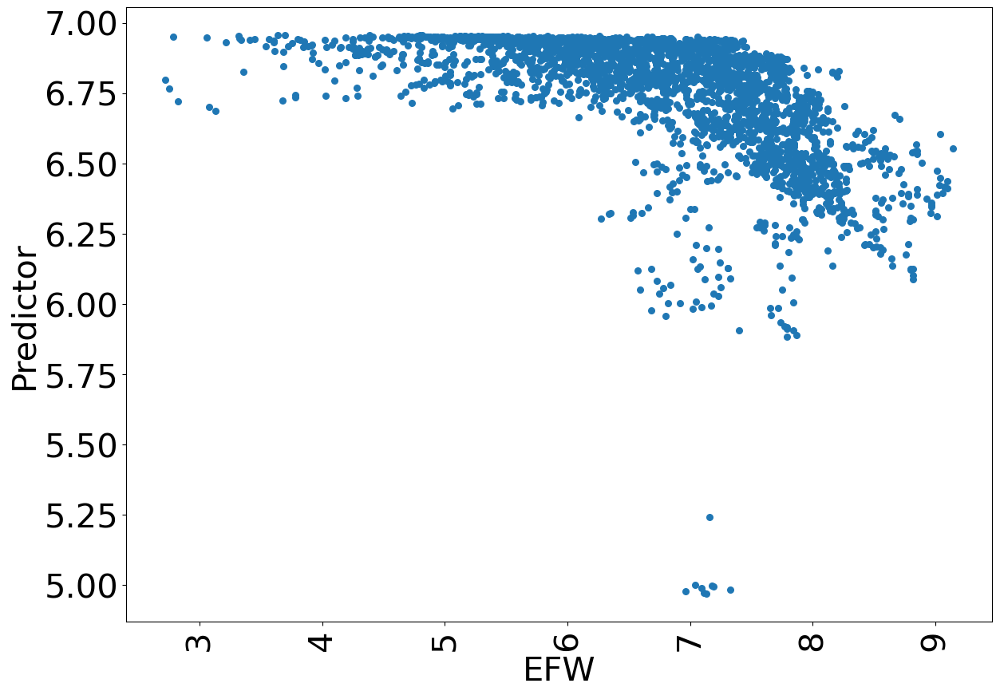

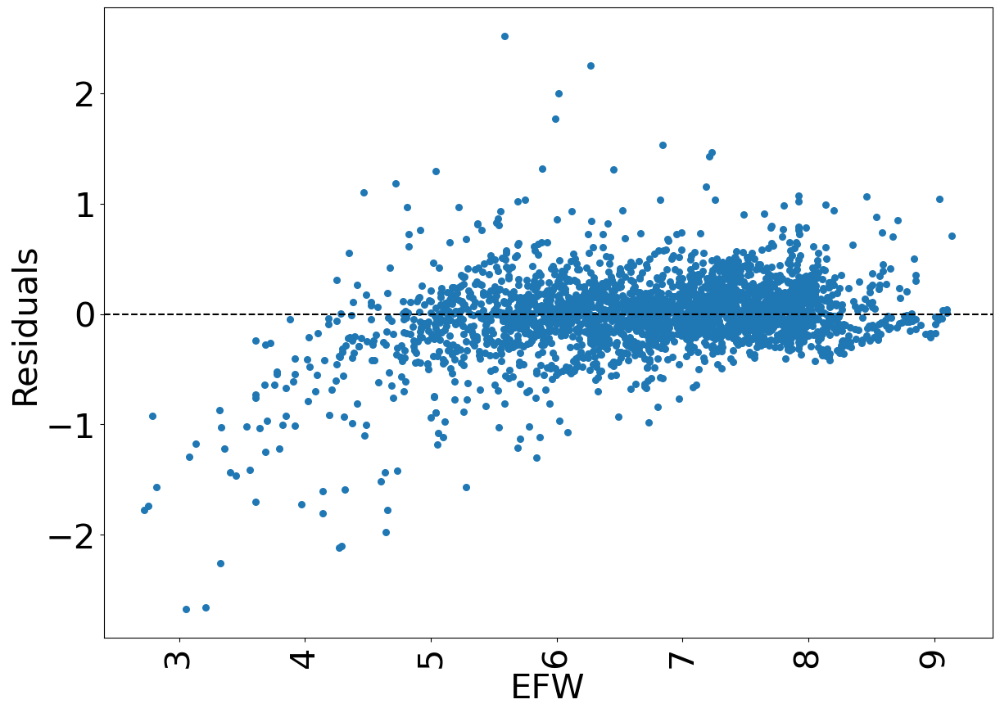

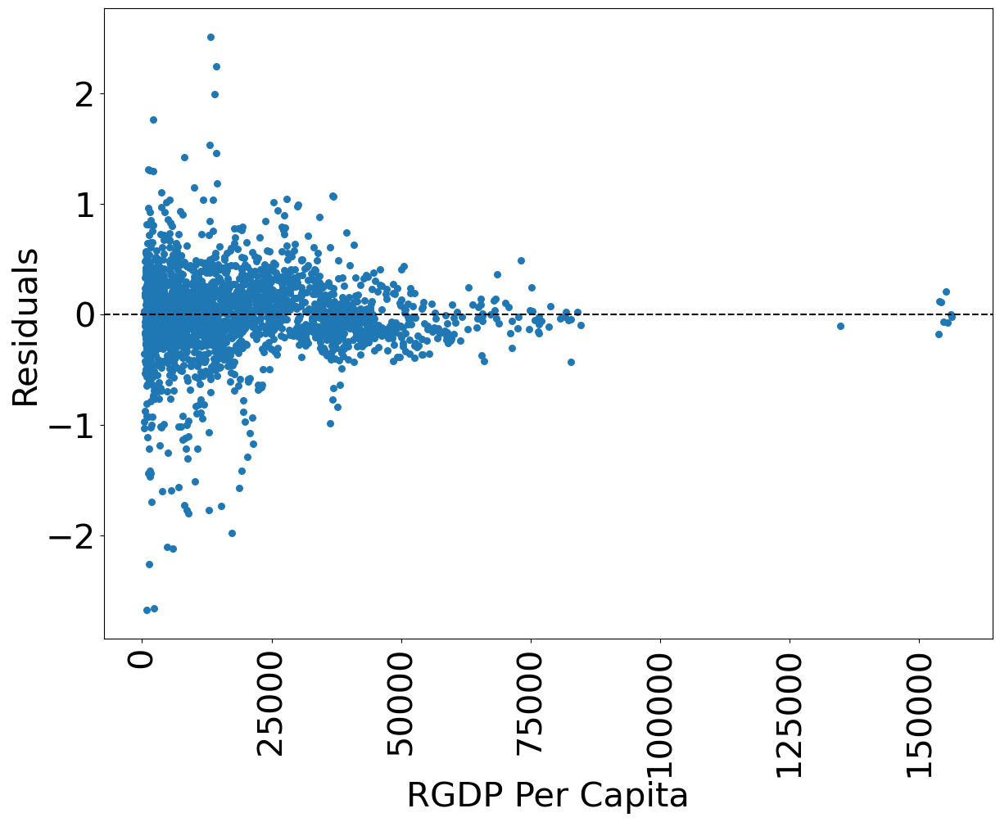

In [20]:
reg_data["Predictor"] = results.predict()
reg_data["Residuals"] = results.resids
plot_residuals(reg_data, y_name, X_names)

/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/1817762948.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["constant"] = 1
/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/4272421763.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Predictor"] = results.predict()
/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/4272421763.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

Entity: Truen\Time: True
                          PanelOLS Estimation Summary                           
Dep. Variable:                    EFW   R-squared:                        0.0121
Estimator:                   PanelOLS   R-squared (Between):             -0.3218
No. Observations:                2808   R-squared (Within):              -0.0840
Date:                Tue, May 02 2023   R-squared (Overall):             -0.2833
Time:                        06:32:56   Log-likelihood                   -1043.6
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      32.191
Entities:                         165   P-value                           0.0000
Avg Obs:                       17.018   Distribution:                  F(1,2635)
Min Obs:                       0.0000                                           
Max Obs:                       21.000   F-statistic (robust):             7.6217
   

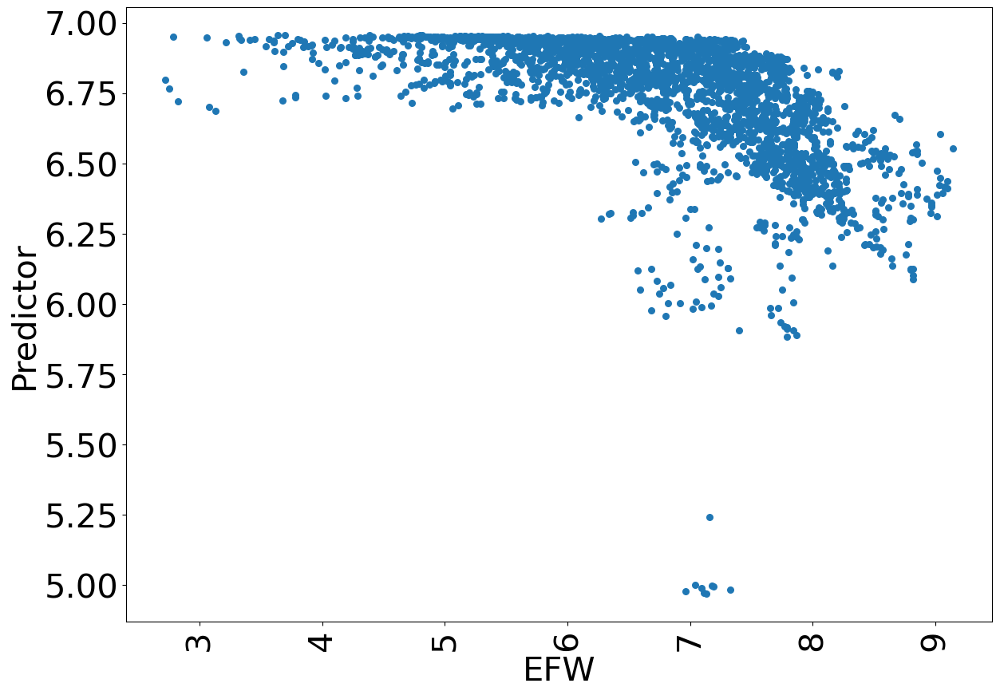

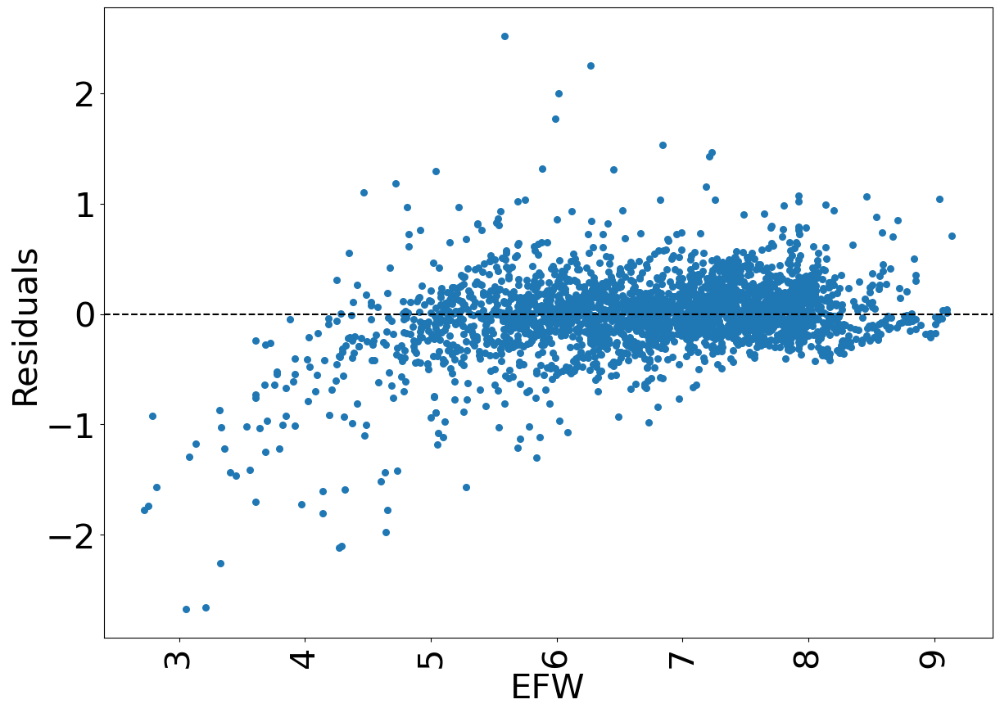

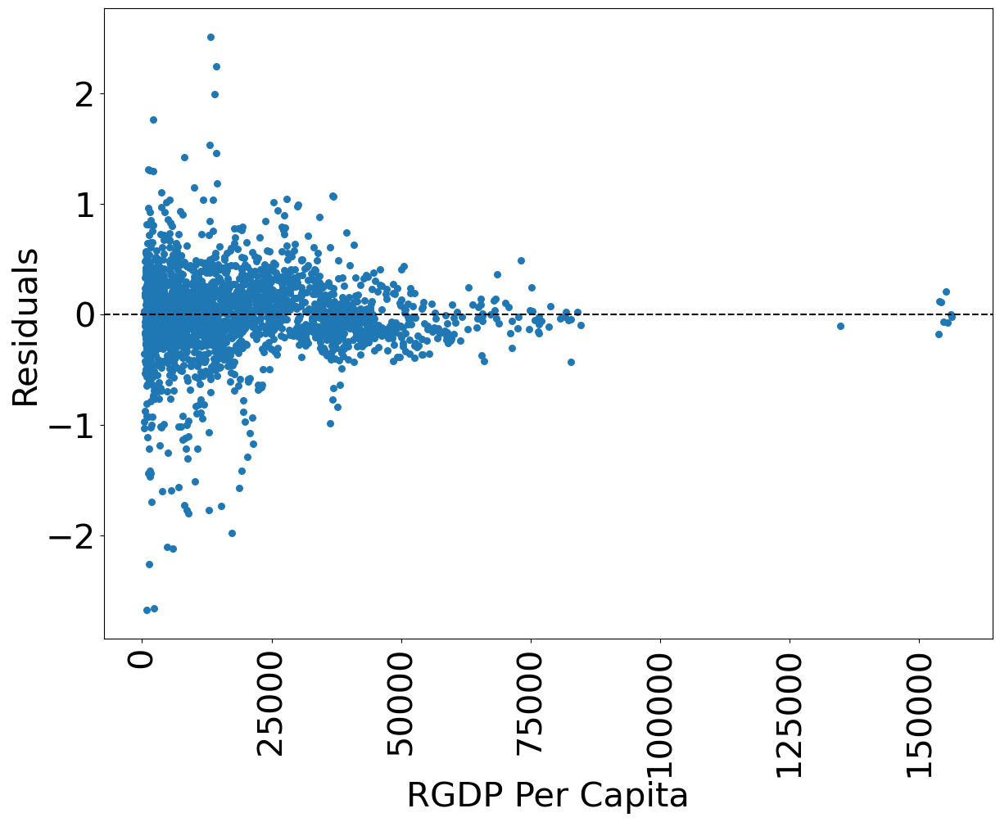

Entity: Truen\Time: False
                          PanelOLS Estimation Summary                           
Dep. Variable:                    EFW   R-squared:                        0.0913
Estimator:                   PanelOLS   R-squared (Between):              0.2795
No. Observations:                2808   R-squared (Within):               0.0913
Date:                Tue, May 02 2023   R-squared (Overall):              0.3228
Time:                        06:32:56   Log-likelihood                   -1562.1
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      266.86
Entities:                         165   P-value                           0.0000
Avg Obs:                       17.018   Distribution:                  F(1,2655)
Min Obs:                       0.0000                                           
Max Obs:                       21.000   F-statistic (robust):             19.260
  

/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/1817762948.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["constant"] = 1
/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/4272421763.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Predictor"] = results.predict()
/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/4272421763.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

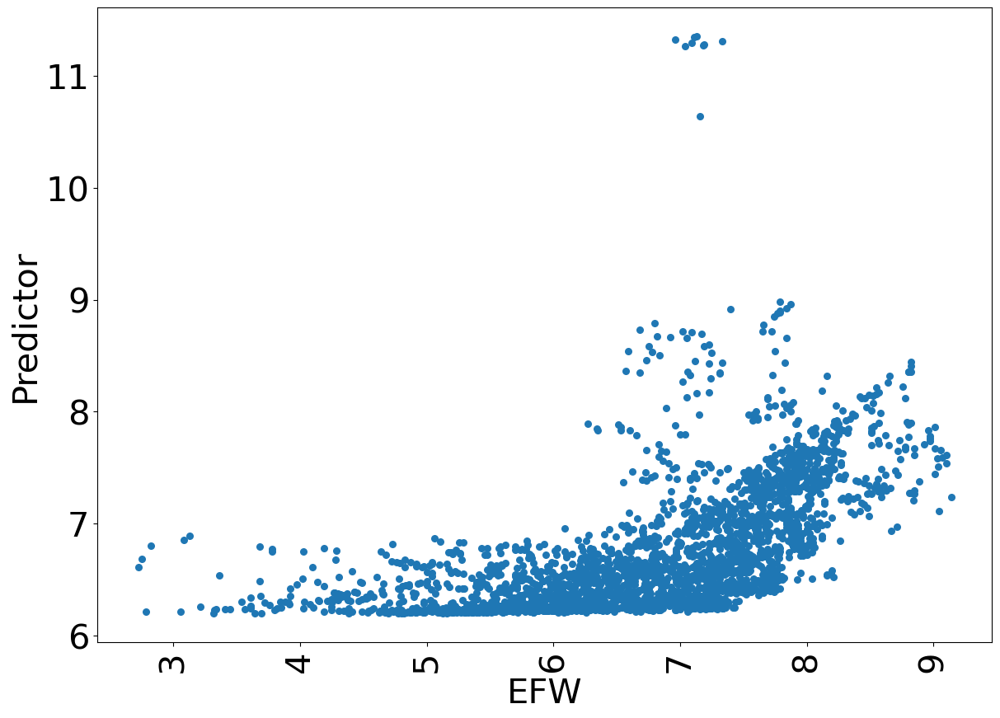

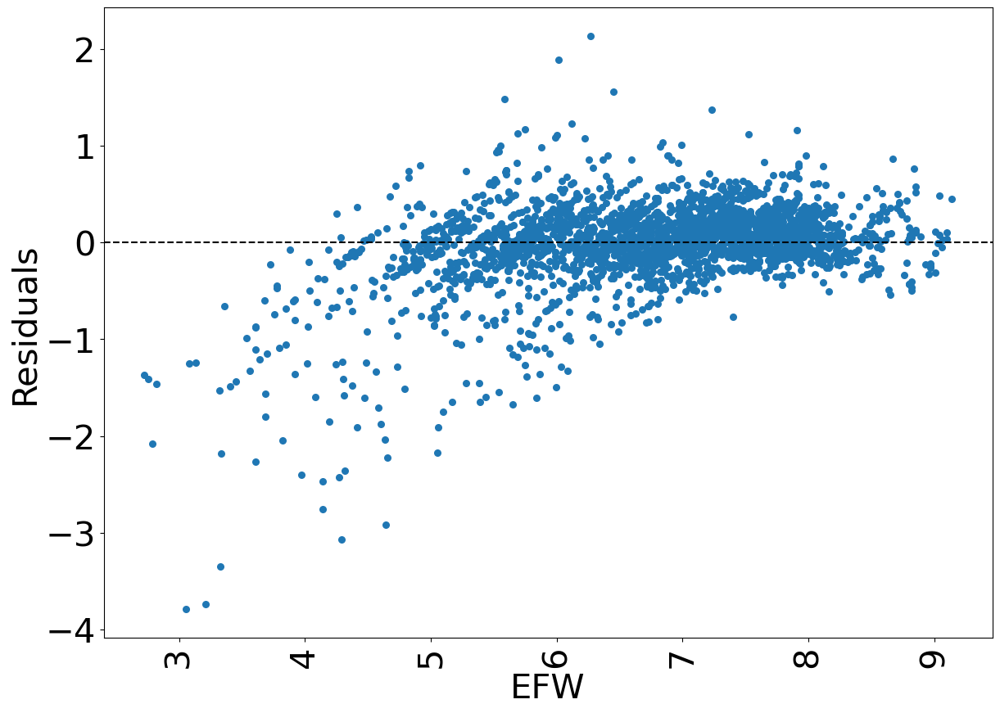

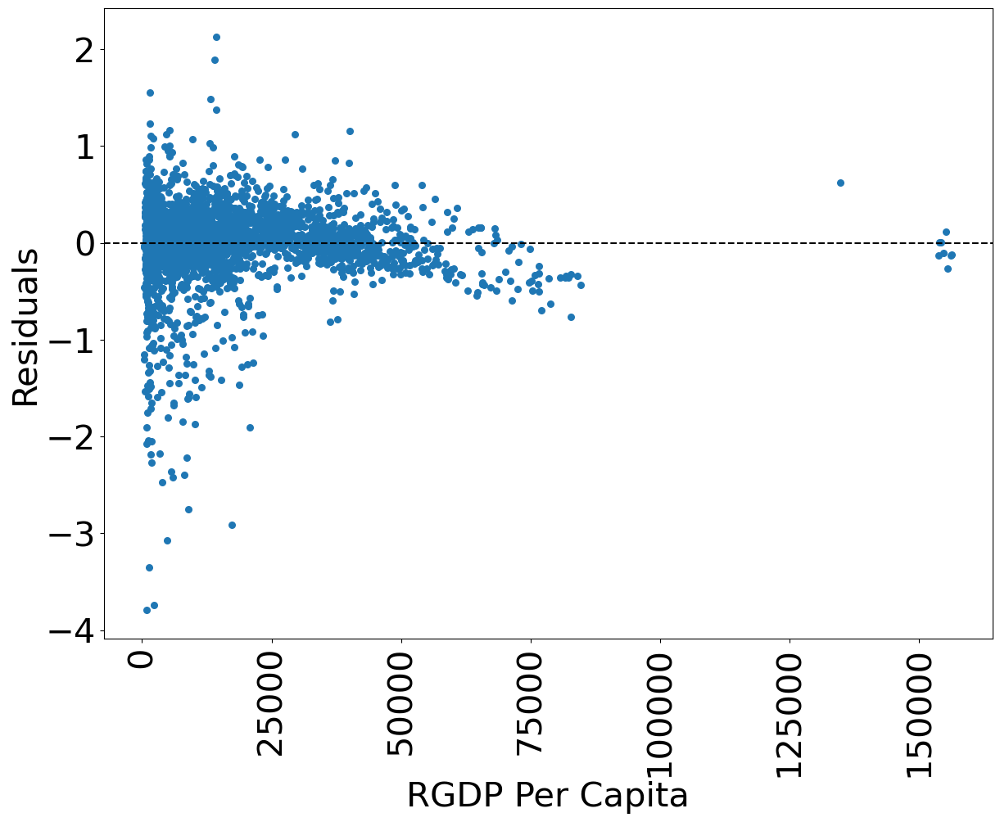

Entity: Falsen\Time: True
                          PanelOLS Estimation Summary                           
Dep. Variable:                    EFW   R-squared:                        0.3172
Estimator:                   PanelOLS   R-squared (Between):              0.2773
No. Observations:                2808   R-squared (Within):               0.0913
Date:                Tue, May 02 2023   R-squared (Overall):              0.3232
Time:                        06:32:56   Log-likelihood                   -3604.2
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      1294.2
Entities:                         165   P-value                           0.0000
Avg Obs:                       17.018   Distribution:                  F(1,2786)
Min Obs:                       0.0000                                           
Max Obs:                       21.000   F-statistic (robust):             24.267
  

/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/1817762948.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["constant"] = 1
/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/4272421763.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Predictor"] = results.predict()
/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/4272421763.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

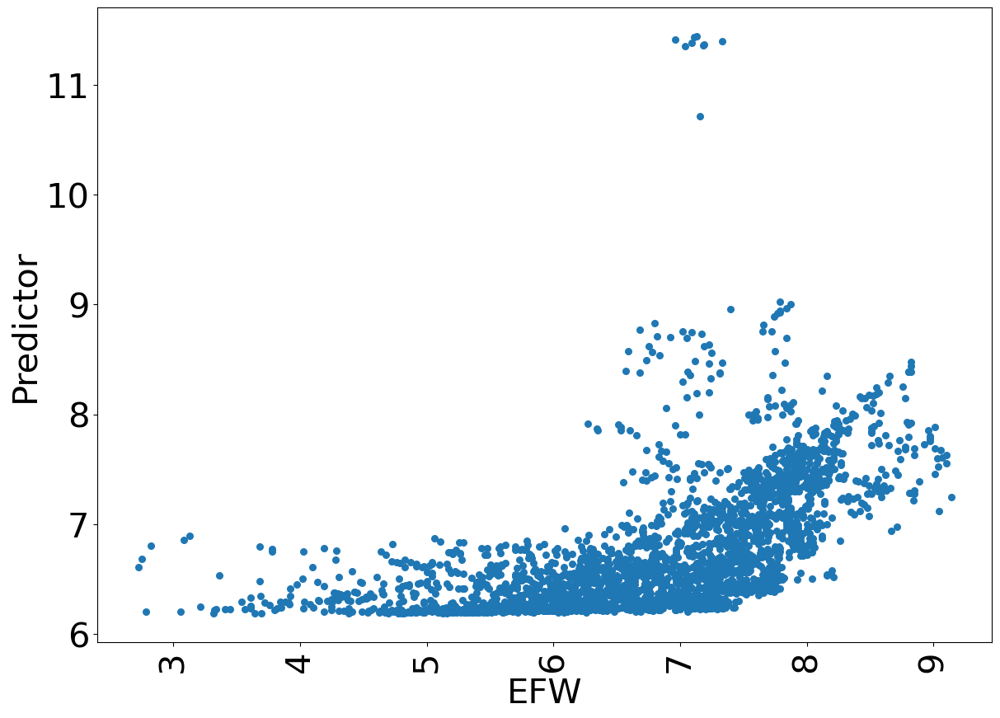

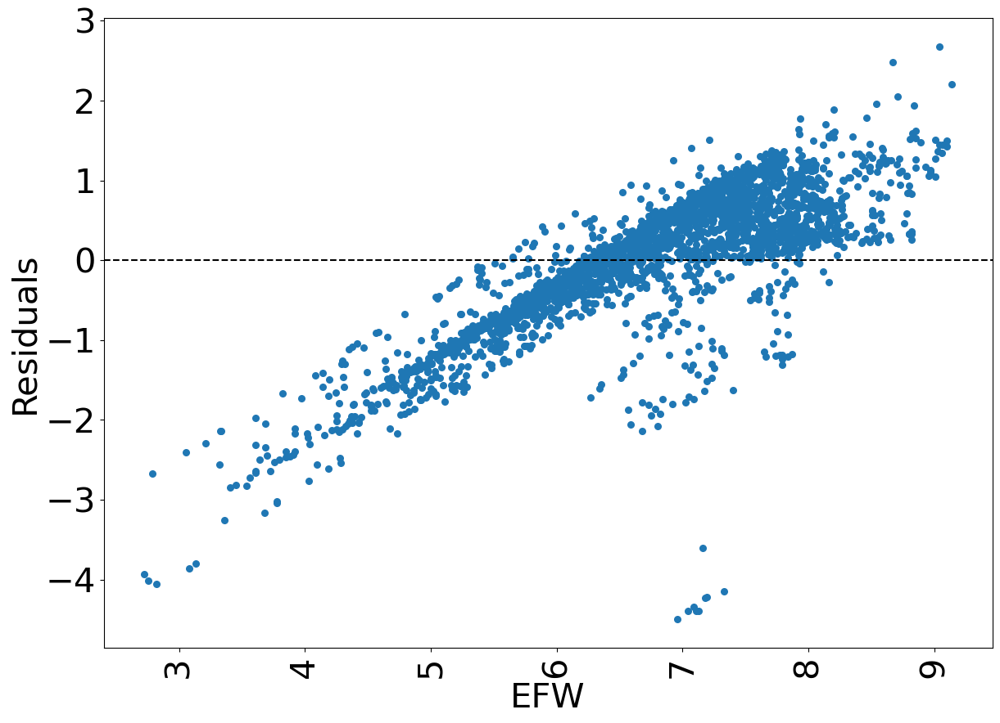

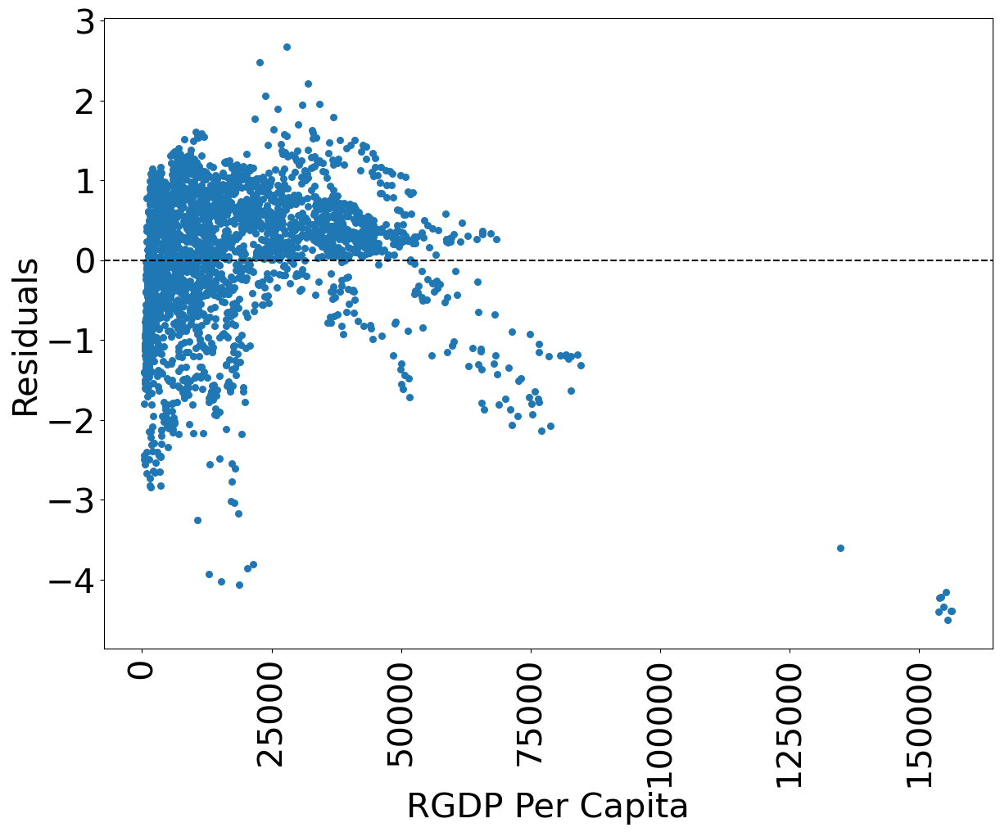

Entity: Falsen\Time: False
                          PanelOLS Estimation Summary                           
Dep. Variable:                    EFW   R-squared:                        0.3233
Estimator:                   PanelOLS   R-squared (Between):              0.2741
No. Observations:                2808   R-squared (Within):               0.0912
Date:                Tue, May 02 2023   R-squared (Overall):              0.3233
Time:                        06:32:57   Log-likelihood                   -3651.1
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      1340.9
Entities:                         165   P-value                           0.0000
Avg Obs:                       17.018   Distribution:                  F(1,2806)
Min Obs:                       0.0000                                           
Max Obs:                       21.000   F-statistic (robust):             25.433
 

/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/1817762948.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["constant"] = 1
/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/4272421763.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Predictor"] = results.predict()
/var/folders/hz/vggy99z9791d4jlzyvlw3r9w0000gn/T/ipykernel_72850/4272421763.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

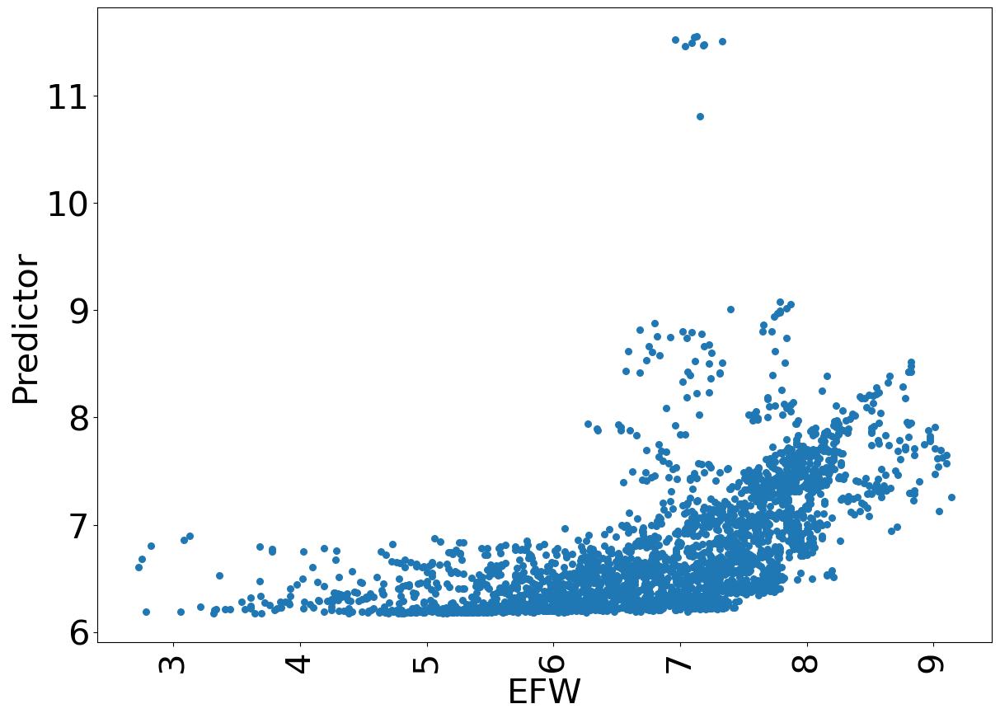

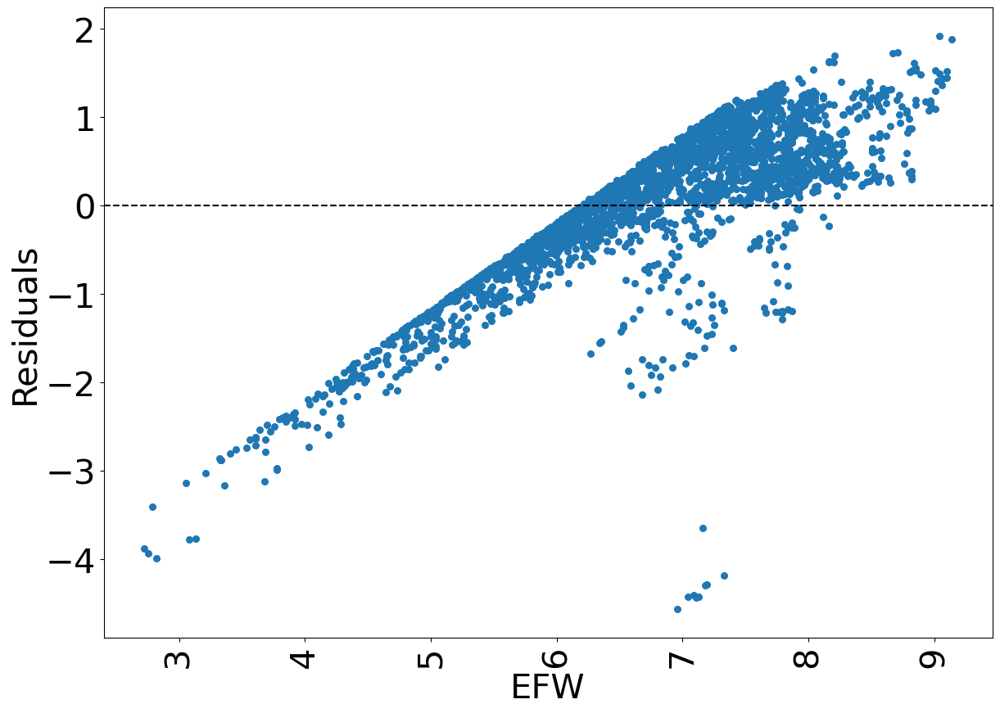

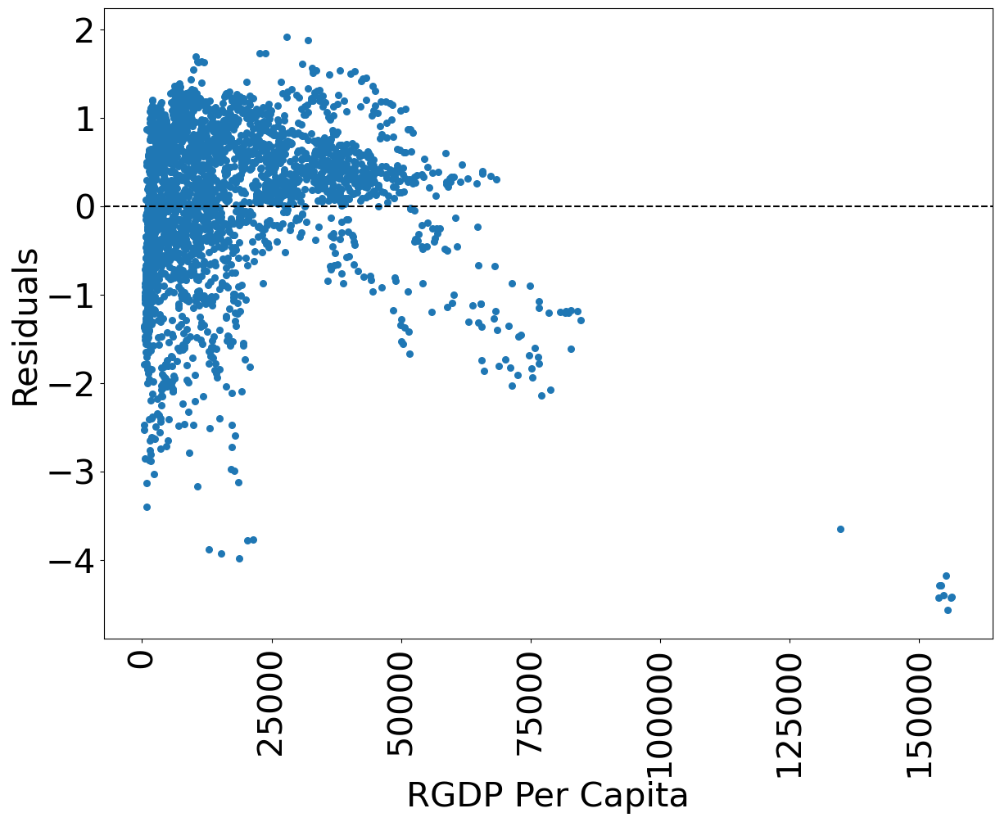

In [21]:
for entity in [True, False]:
    for time in [True, False]:
        reg_data = data.dropna()
        results = panel_regress(reg_data, X_names, y_name, constant = True, entity = entity, time = time)
        print("Entity: " + str(entity) + "n\Time: " + str(time))
        print(results)
        reg_data["Predictor"] = results.predict()
        reg_data["Residuals"] = results.resids
        plot_residuals(reg_data, y_name, X_names)